## EDA


In [1]:
# Installing Required Python Libraries


!pip install numpy
!pip install pandas
!pip install scikit-learn
!pip install matplotlib
!pip install seaborn
!pip install joblib

!pip install spacy
!pip install pyldavis
!pip install language_tool_python
!pip install skll
!pip install keras
!pip install tensorflow
!pip install scikeras

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.6/2.6 MB 23.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 131.7/131.7 kB 3.3 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.8/117.8 kB 1.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.1/12.1 MB 51.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 44.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 526.7/526.7 kB 41.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.3/207.3 kB 22.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 266.8/266.8 kB 32.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 6.4 MB/s eta 0:00:00
  Created wheel for skll: filename=skll-5.0.1-py2.py3-none-any.whl size=148089 sha256=d6eb63d4f3e8071aa6acadcb4bef98d677e10ad02fb548e

In [2]:
#TODO - Replace the training dataset with the Converetd Audio Dataset

import pandas as pd
training_data  = pd.read_csv('training_data.tsv', sep='\t', encoding = "ISO-8859-1")\
            .rename(columns={'essay_set': 'topic', 'domain1_score': 'target_score', 'domain2_score': 'topic2_target'})

training_data.sample()

training_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12974 entries, 0 to 12973
Data columns (total 28 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   essay_id        12974 non-null  int64  
 1   topic           12974 non-null  int64  
 2   essay           12974 non-null  object 
 3   rater1_domain1  12974 non-null  int64  
 4   rater2_domain1  12974 non-null  int64  
 5   rater3_domain1  128 non-null    float64
 6   target_score    12974 non-null  int64  
 7   rater1_domain2  1800 non-null   float64
 8   rater2_domain2  1800 non-null   float64
 9   topic2_target   1800 non-null   float64
 10  rater1_trait1   2292 non-null   float64
 11  rater1_trait2   2292 non-null   float64
 12  rater1_trait3   2292 non-null   float64
 13  rater1_trait4   2292 non-null   float64
 14  rater1_trait5   723 non-null    float64
 15  rater1_trait6   723 non-null    float64
 16  rater2_trait1   2292 non-null   float64
 17  rater2_trait2   2292 non-null  

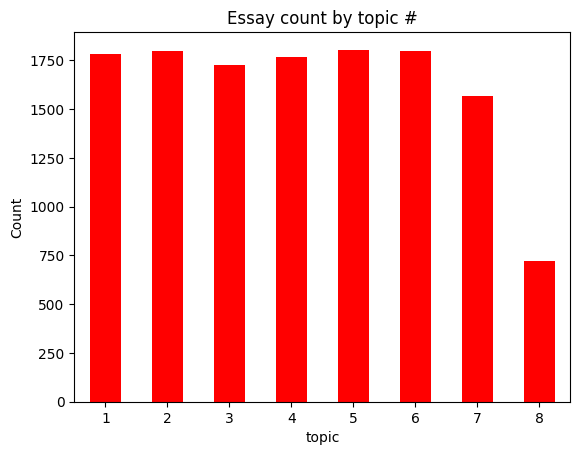

In [3]:
import matplotlib.pyplot as plt

training_data.groupby('topic').agg('count').plot.bar(y='essay', rot=0, legend=False, color = 'red')
plt.title('Essay count by topic #')
plt.ylabel('Count')
plt.show()

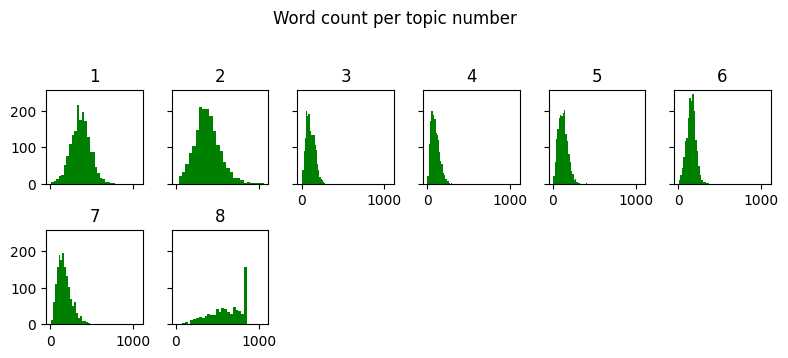

In [4]:
# Count characters and words for each essay
training_data['word_count'] = training_data['essay'].str.strip().str.split().str.len()

training_data.hist(column='word_count', by='topic', bins=25, sharey=True, sharex=True, layout=(3, 6), figsize=(8,5), rot=0, color = 'green')
plt.suptitle('Word count per topic number')
plt.xlabel('Number of words in essay')
plt.tight_layout(rect=[0, 0.04, 1, 0.96])
plt.show()

<ipython-input-5-b970af72cee0>:13: UserWarning: 'set_params()' not defined for locator of type <class 'matplotlib.category.StrCategoryLocator'>
  ax[3,0].locator_params(nbins=10)
<ipython-input-5-b970af72cee0>:14: UserWarning: 'set_params()' not defined for locator of type <class 'matplotlib.category.StrCategoryLocator'>
  ax[3,1].locator_params(nbins=10)


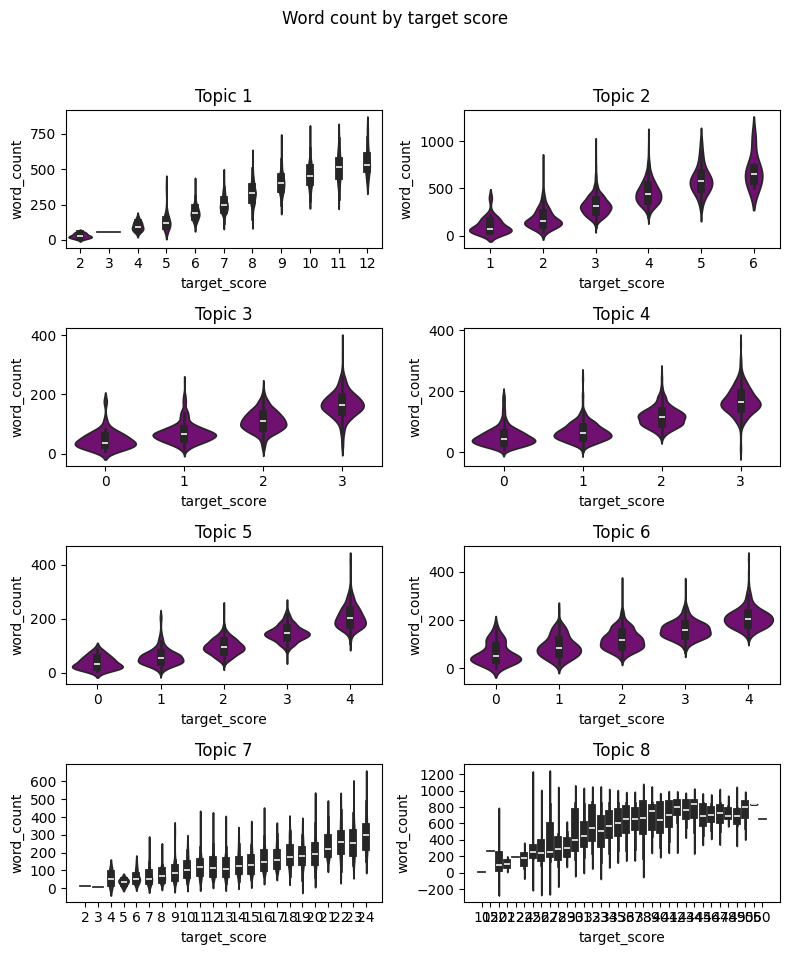

In [5]:
import seaborn as sns

#Get word count by score using the topic and target_score features
training_data.groupby(['topic'])['target_score'].agg(['min','max','count','nunique'])

topic_number = 0
fig, ax = plt.subplots(4,2, figsize=(8,10))
for i in range(4):
    for j in range(2):
        topic_number += 1
        sns.violinplot(x='target_score', y='word_count', data=training_data[training_data['topic'] == topic_number], ax=ax[i,j], color = 'purple')
        ax[i,j].set_title('Topic %i' % topic_number)
ax[3,0].locator_params(nbins=10)
ax[3,1].locator_params(nbins=10)
plt.suptitle('Word count by target score')
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

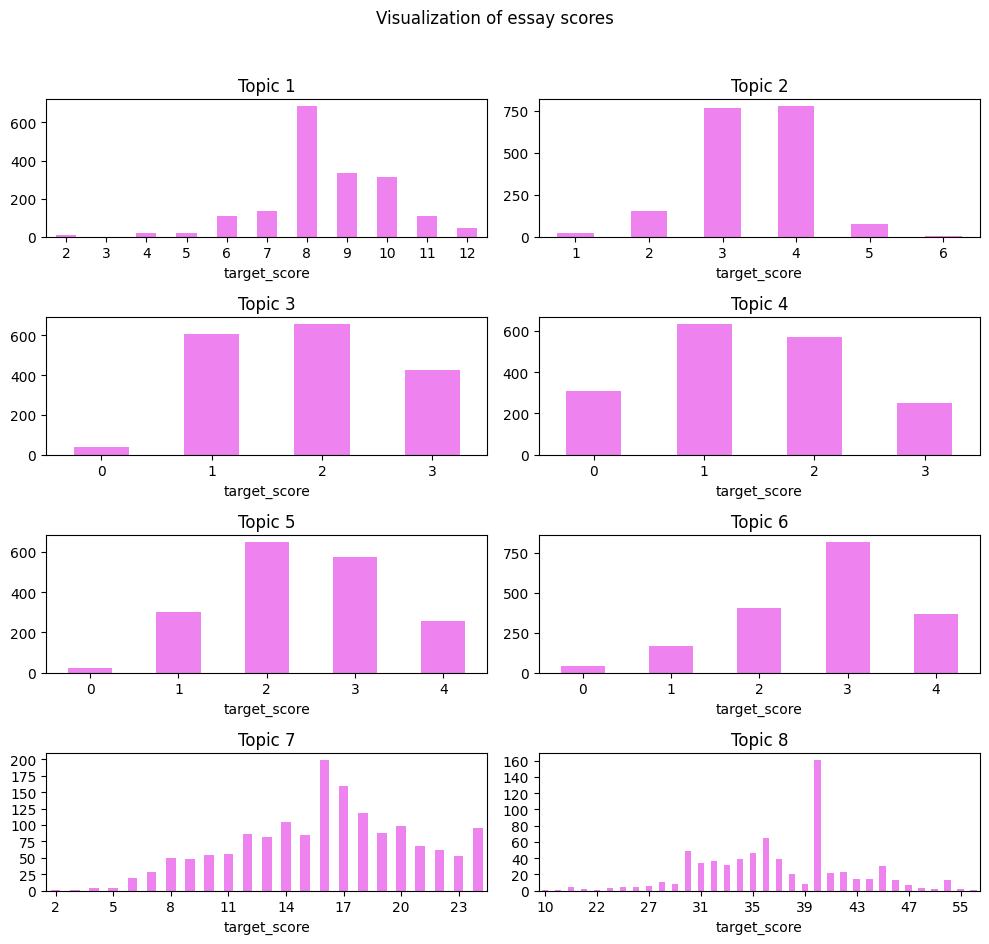

In [6]:
#Visualization of the essay scores
topic_number = 0
fig, ax = plt.subplots(4,2, figsize=(10,10), sharey=False)
for i in range(4):
    for j in range(2):
        topic_number += 1
        training_data[training_data['topic'] == topic_number]\
            .groupby('target_score')['essay_id']\
            .agg('count')\
            .plot.bar(ax=ax[i, j], rot=0, color = 'violet')
        ax[i,j].set_title('Topic %i' % topic_number)
ax[3,0].locator_params(nbins=10)
ax[3,1].locator_params(nbins=10)
plt.suptitle('Visualization of essay scores')
plt.tight_layout(rect=[0, 0.04, 1, 0.96])
plt.show()


### Language Correction

In [7]:
text = 'I an takung TOEFL examm instaed of IELTS'

from textblob import TextBlob
data = TextBlob(text)
print (data.correct())

I an taking TOEFL exam instead of IELTS


In [8]:
# From our observation textblob is not so accurate so using language_tool_python instead

import language_tool_python
tool = language_tool_python.LanguageTool('en-US')

matches = tool.check(text)
tool.correct(text)


text = training_data.essay[80]
text

matches = tool.check(text)
tool.correct(text)

INFO:language_tool_python.download_lt:Unzipping /tmp/tmpzhlbpv5m.zip to /root/.cache/language_tool_python.
INFO:language_tool_python.download_lt:Downloaded https://www.languagetool.org/download/LanguageTool-6.4.zip to /root/.cache/language_tool_python.


"Dear Local Newspaper, I think that using computers is a good thing, and it does not affect on exercising, enjoying nature, and interacting with family and friends. Here are three reasons to support my opinion people learn more on the internet, children at school can go online to find what was for homework, and how the internet does not affect everyday life. My first reason why I think using computers is good because people learn more on the internet, You know what people say, you learn something new every day. Well, if you are wondering about something or if you're thought about something, the internet can help you find what you're looking for, @ORGANIZATION1 is a great site to find what you're looking for. It also has its own images if you need a picture for your project you need. My second main reason to why using the internet is good because if you're a @CAPS1, you can go online to check what you have for each subject. If you're a @CAPS1 and you don't want to do homework at recess 

In [ ]:
training_data['matches'] = training_data['essay'].apply(lambda txt: tool.check(txt))
training_data['corrections'] = training_data.apply(lambda l: len(l['matches']), axis=1)
training_data['corrected'] = training_data.apply(lambda l: tool.correct(l['essay']), axis=1)

# saving corrected dataset
training_data.to_pickle('training_corrected.pkl')


print('Orginial Statement From Essay:', training_data.essay[100])
print('Corrected Statment with language_tool_python:',training_data.corrected[100])

Orginial Statement From Essay: Dear Local Newspaper, Have you ever gone somewhere, taken pictures, and posted them on the computer? If you have you will remember where you visited. But atleast you went to @ORGANIZATION1, or @LOCATION1 or somewhere. There are some people who are on the computer all day. Instead of experiencing nature and taken on @CAPS1 life brings to them, they are on facebook or youtube all day. This disgusts me because there are many fun, beautiful, and entertainings things to do. In @CAPS2 opinion I think computers have negative effects on people. People miss out on enjoying nature or interacting with friends and family. Some people do not get exercise anymore and it hurts to see obese people just sit ther and do nothing about there lives. First I'd like to talk about obesity. Did you know that @PERCENT1 of children are obese at young a young age? Computers take the place of exercising for a young boy or girl. They should go outside and play sports like basketball o

### Tokenizing

In [9]:
import spacy
from spacy.lang.en.stop_words import STOP_WORDS
from string import punctuation

In [10]:
training_data = pd.read_pickle('training_corrected.pkl')

stop_words = set(STOP_WORDS)
stop_words.update(punctuation)

In [ ]:
sentences = []
tokens = []
lemmatizedtokens = []
partsofspeech = []
nouns = []

# Loading the spaCy English language model pipeline for text processing using small model
nlp = spacy.load('en_core_web_sm')


for essay in nlp.pipe(training_data['corrected'], batch_size=100):
    if essay.is_parsed:
        tokens.append([e.text for e in essay])
        sentences.append([sent.text.strip() for sent in essay.sents])
        partsofspeech.append([e.pos_ for e in essay])
        nouns.append([e.text for e in essay.ents])
        lemmatizedtokens.append([n.lemma_ for n in essay])
    else:
        tokens.append(None)
        lemmatizedtokens.append(None)
        partsofspeech.append(None)
        sentences.append(None)
        nouns.append(None)

training_data['tokens_sm'] = tokens
training_data['lemmatizedtokens_sm'] = lemmatizedtokens
training_data['partsofspeech_sm'] = partsofspeech
training_data['sentences_sm'] = sentences
training_data['nouns_sm'] = nouns

training_data[['tokens_sm', 'lemmatizedtokens_sm', 'partsofspeech_sm', 'sentences_sm', 'nouns_sm']].head()

training_data.to_pickle('training_spacy_sm.pkl')

training_data = pd.read_pickle('training_spacy_sm.pkl')


<ipython-input-15-c66486ff0bcd>:12: DeprecationWarning: [W107] The property `Doc.is_parsed` is deprecated. Use `Doc.has_annotation("DEP")` instead.
  if essay.is_parsed:


,tokens_sm,lemmatizedtokens_sm,partsofspeech_sm,sentences_sm,nouns_sm
0,"[Dear, local, newspaper, ,, I, think, effects,...","[dear, local, newspaper, ,, I, think, effect, ...","[ADJ, ADJ, NOUN, PUNCT, PRON, VERB, NOUN, NOUN...","[Dear local newspaper, I think effects compute...","[Facebook, MySpace]"
1,"[Dear, @CAPS1, @CAPS2, ,, I, believe, that, us...","[Dear, @CAPS1, @CAPS2, ,, I, believe, that, us...","[PROPN, PROPN, PROPN, PUNCT, PRON, VERB, SCONJ...","[Dear @CAPS1 @CAPS2, I believe that using comp...","[Facebook and MySpace, millions, one, MySpace,..."
2,"[Dear, ,, @CAPS1, @CAPS2, @CAPS3, More, and, m...","[dear, ,, @CAPS1, @CAPS2, @CAPS3, More, and, m...","[ADJ, PUNCT, PROPN, PROPN, PROPN, ADJ, CCONJ, ...","[Dear, @CAPS1 @CAPS2 @CAPS3 More and more peop...","[today, one, a thousand]"
3,"[Dear, Local, Newspaper, ,, @CAPS1, I, have, f...","[Dear, Local, Newspaper, ,, @CAPS1, I, have, f...","[PROPN, PROPN, PROPN, PUNCT, PROPN, PRON, AUX,...","[Dear Local Newspaper, @CAPS1 I have found tha...","[Dear Local Newspaper, @PERSON1, A+, @CAPS7, N..."
4,"[Dear, @LOCATION1, ,, I, know, having, compute...","[dear, @LOCATION1, ,, I, know, have, computer,...","[ADJ, PROPN, PUNCT, PRON, VERB, VERB, NOUN, VE...","[Dear @LOCATION1, I know having computers has ...","[First, one, Secondly, one, only one]"


In [ ]:
sentences = []
tokens = []
lemmatizedtokens = []
partsofspeech = []
nouns = []

!python -m spacy download en_core_web_md

# Loading the spaCy English language model pipeline for text processing using medium model
nlp = spacy.load('en_core_web_md')


for essay in nlp.pipe(training_data['corrected'], batch_size=100):
    if essay.is_parsed:
        tokens.append([e.text for e in essay])
        sentences.append([sent.text.strip() for sent in essay.sents])
        partsofspeech.append([e.pos_ for e in essay])
        nouns.append([e.text for e in essay.ents])
        lemmatizedtokens.append([n.lemma_ for n in essay])
    else:
        tokens.append(None)
        lemmatizedtokens.append(None)
        partsofspeech.append(None)
        sentences.append(None)
        nouns.append(None)

training_data['tokens_md'] = tokens
training_data['lemmatizedtokens_md'] = lemmatizedtokens
training_data['partsofspeech_md'] = partsofspeech
training_data['sentences_md'] = sentences
training_data['nouns_md'] = nouns

training_data[['tokens_md', 'lemmatizedtokens_md', 'partsofspeech_md', 'sentences_md', 'nouns_md']].head()

training_data.to_pickle('training_spacy_md.pkl')

training_data = pd.read_pickle('training_spacy_md.pkl')



     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.8/42.8 MB 13.3 MB/s eta 0:00:00
✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_md')
⚠ Restart to reload dependencies
If you are in a Jupyter or Colab notebook, you may need to restart Python in
order to load all the package's dependencies. You can do this by selecting the
'Restart kernel' or 'Restart runtime' option.


<ipython-input-16-b2aaa09bc59f>:14: DeprecationWarning: [W107] The property `Doc.is_parsed` is deprecated. Use `Doc.has_annotation("DEP")` instead.
  if essay.is_parsed:


,tokens_md,lemmatizedtokens_md,partsofspeech_md,sentences_md,nouns_md
0,"[Dear, local, newspaper, ,, I, think, effects,...","[dear, local, newspaper, ,, I, think, effect, ...","[ADJ, ADJ, NOUN, PUNCT, PRON, VERB, NOUN, NOUN...","[Dear local newspaper, I think effects compute...","[@ORGANIZATION2, @CAPS1, Facebook, MySpace, al..."
1,"[Dear, @CAPS1, @CAPS2, ,, I, believe, that, us...","[dear, @CAPS1, @CAPS2, ,, I, believe, that, us...","[ADJ, NOUN, PROPN, PUNCT, PRON, VERB, SCONJ, V...","[Dear @CAPS1, @CAPS2, I believe that using com...","[@CAPS2, Facebook, MySpace, millions, one, MyS..."
2,"[Dear, ,, @CAPS1, @CAPS2, @CAPS3, More, and, m...","[dear, ,, @CAPS1, @CAPS2, @CAPS3, more, and, m...","[ADJ, PUNCT, PUNCT, PROPN, PROPN, ADV, CCONJ, ...","[Dear, @CAPS1 @CAPS2 @CAPS3 More and more peop...","[@CAPS1, today, @CAPS4, one, @MONTH1, @CAPS5]"
3,"[Dear, Local, Newspaper, ,, @CAPS1, I, have, f...","[dear, Local, Newspaper, ,, @CAPS1, I, have, f...","[ADJ, PROPN, PROPN, PUNCT, PROPN, PRON, AUX, V...","[Dear Local Newspaper, @CAPS1 I have found tha...","[Dear Local Newspaper, @CAPS1, @PERCENT1, @CAP..."
4,"[Dear, @LOCATION1, ,, I, know, having, compute...","[dear, @LOCATION1, ,, I, know, have, computer,...","[ADJ, PROPN, PUNCT, PRON, VERB, VERB, NOUN, VE...","[Dear @LOCATION1, I know having computers has ...","[First, one, Secondly, one, only one, @CAPS1]"


In [ ]:
sentences = []
tokens = []
lemmatizedtokens = []
partsofspeech = []
nouns = []

!python -m spacy download en_core_web_lg
# Loading the spaCy English language model for text processing using large model
nlp = spacy.load('en_core_web_lg')


for essay in nlp.pipe(training_data['corrected'], batch_size=100):
    if essay.is_parsed:
        tokens.append([e.text for e in essay])
        sentences.append([sent.text.strip() for sent in essay.sents])
        partsofspeech.append([e.pos_ for e in essay])
        nouns.append([e.text for e in essay.ents])
        lemmatizedtokens.append([n.lemma_ for n in essay])
    else:
        tokens.append(None)
        lemmatizedtokens.append(None)
        partsofspeech.append(None)
        sentences.append(None)
        nouns.append(None)

training_data['tokens'] = tokens
training_data['lemmatizedtokens'] = lemmatizedtokens
training_data['partsofspeech'] = partsofspeech
training_data['sentences'] = sentences
training_data['nouns'] = nouns

training_data[['tokens', 'lemmatizedtokens', 'partsofspeech', 'sentences', 'nouns']].head()

training_data.to_pickle('training_spacy_lg.pkl')

training_data = pd.read_pickle('training_spacy_lg.pkl')



     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 587.7/587.7 MB 988.0 kB/s eta 0:00:00
✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_lg')
⚠ Restart to reload dependencies
If you are in a Jupyter or Colab notebook, you may need to restart Python in
order to load all the package's dependencies. You can do this by selecting the
'Restart kernel' or 'Restart runtime' option.


<ipython-input-17-3d682f9c0a6b>:13: DeprecationWarning: [W107] The property `Doc.is_parsed` is deprecated. Use `Doc.has_annotation("DEP")` instead.
  if essay.is_parsed:


,tokens,lemmatizedtokens,partsofspeech,sentences,nouns
0,"[Dear, local, newspaper, ,, I, think, effects,...","[dear, local, newspaper, ,, I, think, effect, ...","[ADJ, ADJ, NOUN, PUNCT, PRON, VERB, NOUN, NOUN...","[Dear local newspaper, I think effects compute...","[@ORGANIZATION2, @CAPS1, Facebook, MySpace, @C..."
1,"[Dear, @CAPS1, @CAPS2, ,, I, believe, that, us...","[Dear, @caps1, @caps2, ,, I, believe, that, us...","[PROPN, X, ADV, PUNCT, PRON, VERB, SCONJ, VERB...","[Dear @CAPS1, @CAPS2, I believe that using com...","[Facebook, MySpace, millions, one, MySpace, Fa..."
2,"[Dear, ,, @CAPS1, @CAPS2, @CAPS3, More, and, m...","[dear, ,, @CAPS1, @CAPS2, @CAPS3, More, and, m...","[INTJ, PUNCT, PROPN, PROPN, PROPN, ADJ, CCONJ,...","[Dear, @CAPS1 @CAPS2 @CAPS3 More and more peop...","[@CAPS1 @CAPS2, today, one, @CAPS4, one, @MONT..."
3,"[Dear, Local, Newspaper, ,, @CAPS1, I, have, f...","[Dear, Local, Newspaper, ,, @caps1, I, have, f...","[PROPN, PROPN, PROPN, PUNCT, INTJ, PRON, AUX, ...","[Dear Local Newspaper, @CAPS1 I have found tha...","[Dear Local Newspaper, @CAPS1, @PERSON1, @CAPS..."
4,"[Dear, @LOCATION1, ,, I, know, having, compute...","[Dear, @LOCATION1, ,, I, know, have, computer,...","[PROPN, PROPN, PUNCT, PRON, VERB, VERB, NOUN, ...","[Dear @LOCATION1, I know having computers has ...","[First, one, Secondly, only one, @CAPS1]"


In [11]:
training_data = pd.read_pickle('training_spacy_lg.pkl')

### Generate vectorized features from processed essays


In [12]:
reference_essays = {1: 125, 2: 3016, 3: 5254, 4: 5343, 5: 7206, 6: 8892, 7: 11794, 8: 12341}
references = {}
!python -m spacy download en_core_web_lg
nlp = spacy.load('en_core_web_lg')

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 587.7/587.7 MB 2.4 MB/s eta 0:00:00
✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_lg')
⚠ Restart to reload dependencies
If you are in a Jupyter or Colab notebook, you may need to restart Python in
order to load all the package's dependencies. You can do this by selecting the
'Restart kernel' or 'Restart runtime' option.


In [13]:
for topic, index in reference_essays.items():
    references[topic] = nlp(training_data.iloc[index]['essay'])

# getting similarity for each essay
training_data['similarity'] = training_data.apply(lambda row: nlp(row['essay']).similarity(references[row['topic']]), axis=1)

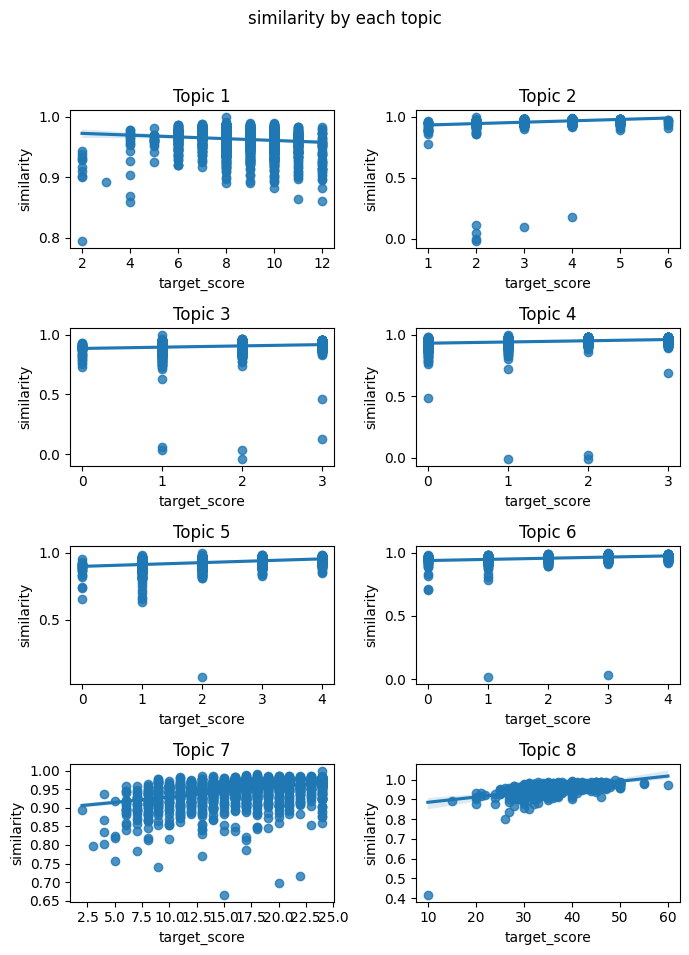

In [14]:
# Plotting document similarity vs target score for each topic

topic_number = 0
fig, ax = plt.subplots(4,2, figsize=(7,10))
for i in range(4):
    for j in range(2):
        topic_number += 1
        sns.regplot(x='target_score', y='similarity', data=training_data[training_data['topic'] == topic_number], ax=ax[i,j])
        ax[i,j].set_title('Topic %i' % topic_number)
ax[3,0].locator_params(nbins=10)
ax[3,1].locator_params(nbins=10)
plt.suptitle('similarity by each topic')
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

In [15]:
# counting various features and applying feature engineering to feed to Neural  Network

training_data['token_count'] = training_data.apply(lambda x: len(x['tokens']), axis=1)

training_data['unique_token_count'] = training_data.apply(lambda x: len(set(x['tokens'])), axis=1)

training_data['nostop_count'] = training_data.apply(lambda x: len([token for token in x['tokens'] if token not in stop_words]), axis=1)

training_data['sent_count'] = training_data.apply(lambda x: len(x['sentences']), axis=1)

training_data['ner_count'] = training_data.apply(lambda x: len(x['nouns']), axis=1)

training_data['comma'] = training_data.apply(lambda x: x['corrected'].count(','), axis=1)

training_data['question'] = training_data.apply(lambda x: x['corrected'].count('?'), axis=1)

training_data['exclamation'] = training_data.apply(lambda x: x['corrected'].count('!'), axis=1)

training_data['quotation'] = training_data.apply(lambda x: x['corrected'].count('"') + x['corrected'].count("'"), axis=1)

training_data['organization'] = training_data.apply(lambda x: x['corrected'].count(r'@ORGANIZATION'), axis=1)

training_data['caps'] = training_data.apply(lambda x: x['corrected'].count(r'@CAPS'), axis=1)

training_data['person'] = training_data.apply(lambda x: x['corrected'].count(r'@PERSON'), axis=1)

training_data['location'] = training_data.apply(lambda x: x['corrected'].count(r'@LOCATION'), axis=1)

training_data['money'] = training_data.apply(lambda x: x['corrected'].count(r'@MONEY'), axis=1)

training_data['time'] = training_data.apply(lambda x: x['corrected'].count(r'@TIME'), axis=1)

training_data['date'] = training_data.apply(lambda x: x['corrected'].count(r'@DATE'), axis=1)

training_data['percent'] = training_data.apply(lambda x: x['corrected'].count(r'@PERCENT'), axis=1)

training_data['noun'] = training_data.apply(lambda x: x['partsofspeech'].count('NOUN'), axis=1)

training_data['adj'] = training_data.apply(lambda x: x['partsofspeech'].count('ADJ'), axis=1)

training_data['pron'] = training_data.apply(lambda x: x['partsofspeech'].count('PRON'), axis=1)

training_data['verb'] = training_data.apply(lambda x: x['partsofspeech'].count('VERB'), axis=1)

training_data['noun'] = training_data.apply(lambda x: x['partsofspeech'].count('NOUN'), axis=1)

training_data['cconj'] = training_data.apply(lambda x: x['partsofspeech'].count('CCONJ'), axis=1)

training_data['adv'] = training_data.apply(lambda x: x['partsofspeech'].count('ADV'), axis=1)

training_data['det'] = training_data.apply(lambda x: x['partsofspeech'].count('DET'), axis=1)

training_data['propn'] = training_data.apply(lambda x: x['partsofspeech'].count('PROPN'), axis=1)

training_data['num'] = training_data.apply(lambda x: x['partsofspeech'].count('NUM'), axis=1)

training_data['part'] = training_data.apply(lambda x: x['partsofspeech'].count('PART'), axis=1)

training_data['intj'] = training_data.apply(lambda x: x['partsofspeech'].count('INTJ'), axis=1)

In [ ]:
# save to file
training_data.to_pickle('training_features.pkl')

In [16]:
list(training_data.columns.values)

['essay_id',
 'topic',
 'essay',
 'rater1_domain1',
 'rater2_domain1',
 'rater3_domain1',
 'target_score',
 'rater1_domain2',
 'rater2_domain2',
 'topic2_target',
 'rater1_trait1',
 'rater1_trait2',
 'rater1_trait3',
 'rater1_trait4',
 'rater1_trait5',
 'rater1_trait6',
 'rater2_trait1',
 'rater2_trait2',
 'rater2_trait3',
 'rater2_trait4',
 'rater2_trait5',
 'rater2_trait6',
 'rater3_trait1',
 'rater3_trait2',
 'rater3_trait3',
 'rater3_trait4',
 'rater3_trait5',
 'rater3_trait6',
 'word_count',
 'matches',
 'corrections',
 'corrected',
 'tokens_sm',
 'lemmatizedtokens_sm',
 'partsofspeech_sm',
 'sentences_sm',
 'nouns_sm',
 'tokens_md',
 'lemmatizedtokens_md',
 'partsofspeech_md',
 'sentences_md',
 'nouns_md',
 'tokens',
 'lemmatizedtokens',
 'partsofspeech',
 'sentences',
 'nouns',
 'similarity',
 'token_count',
 'unique_token_count',
 'nostop_count',
 'sent_count',
 'ner_count',
 'comma',
 'question',
 'exclamation',
 'quotation',
 'organization',
 'caps',
 'person',
 'location',
 

### Topic Modeling with Latent Dirichlet Allocation


In [17]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation #https://towardsdatascience.com/latent-dirichlet-allocation-lda-9d1cd064ffa2
from sklearn.model_selection import train_test_split

In [18]:
import pandas as pd
training_data = pd.read_pickle('training_features.pkl')

In [19]:
#TODO - Replace the topics with the topics in Audio Dataset

topic_dict = {'topic':{1: 'computer',
                       2: 'censorship',
                       3: 'cyclist',
                       4: 'hibiscus',
                       5: 'mood',
                       6: 'dirigibles',
                       7: 'patience',
                       8: 'laughter'}}

training_data.replace(topic_dict, inplace=True)

In [20]:
# creating a list of lemmatized tokens into l_essay column

training_data['l_essay'] = training_data['lemmatizedtokens'].apply(' '.join)

# creating a count vectorizer
count_vectorizer = CountVectorizer(max_df=.2,
                             min_df=3,
                             stop_words=list(STOP_WORDS),
                             max_features=2000)

lemma_matrix = count_vectorizer.fit_transform(training_data.l_essay)
lemma_matrix

/usr/local/lib/python3.10/dist-packages/sklearn/feature_extraction/text.py:408: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ll', 've'] not in stop_words.
  warnings.warn(


<12974x2000 sparse matrix of type '<class 'numpy.int64'>'
	with 546547 stored elements in Compressed Sparse Row format>

In [21]:
# computing most frequent tokens
words = count_vectorizer.get_feature_names_out()

lemma_matrix_df = pd.DataFrame(lemma_matrix.toarray(), columns=words)
print(words, lemma_matrix_df)
word_freq = lemma_matrix_df.sum(axis=0).astype(int)

word_freq.sort_values(ascending=False).head(10)

['1930' '1937' '250' ... 'youth' 'youtube' 'zeppelin']        1930  1937  250  abandon  abhor  ability  able  absolutely  abuse  \
0         0     0    0        0      0        0     0           0      0   
1         0     0    0        0      0        0     1           0      0   
2         0     0    0        0      0        0     0           0      0   
3         0     0    0        0      0        2     0           0      0   
4         0     0    0        0      0        2     1           0      0   
...     ...   ...  ...      ...    ...      ...   ...         ...    ...   
12969     0     0    0        0      0        0     1           0      0   
12970     0     0    0        0      0        0     0           0      0   
12971     0     0    0        0      0        0     0           0      0   
12972     0     0    0        0      0        0     0           0      0   
12973     0     0    0        0      0        0     0           0      0   

       accept  ...  year  yell  

computer     20394
book         13988
building      7838
library       7632
dirigible     6242
read          6130
child         5770
help          5189
offensive     5117
talk          4978
dtype: int64

In [22]:
import joblib

# Applying LDA on lemma matrix
lda_base_model = LatentDirichletAllocation(n_components=8, n_jobs=-1, learning_method='batch', max_iter=40, perp_tol=0.01, verbose=0, evaluate_every=5)
lda_base_model.fit(lemma_matrix)

joblib.dump(lda_base_model, 'lda_baseline.pkl')

['lda_baseline.pkl']

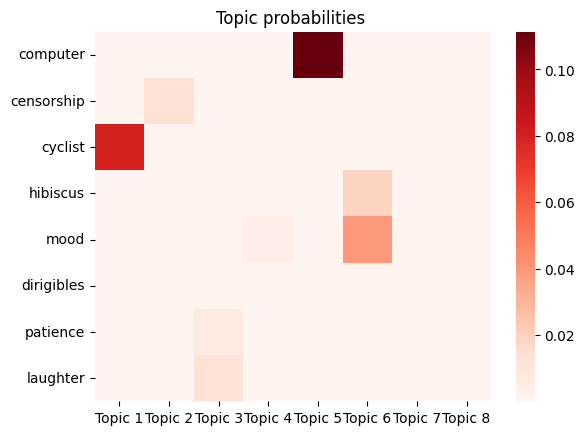

In [23]:
# generating topic probabilities from the LDA
import seaborn as sns
import matplotlib.pyplot as plt

topic_labels = ['Topic {}'.format(i) for i in range(1, 9)]
topics_count = lda_base_model.components_
topics_probability = topics_count / topics_count.sum(axis=1).reshape(-1, 1)
topics = pd.DataFrame(topics_probability.T, index=words, columns=topic_labels)
topics.sample(10)

one_word = list(topic_dict['topic'].values())
sns.heatmap(topics.reindex(one_word), cmap='Reds')
plt.title('Topic probabilities ')
plt.show()

In [24]:
# computing most probable words

probable_words = {}
for topic, words_ in topics.items():
    probable_words[topic] = words_.nlargest(10).index.tolist()
pd.DataFrame(probable_words)


,Topic 1,Topic 2,Topic 3,Topic 4,Topic 5,Topic 6,Topic 7,Topic 8
0,cyclist,book,laugh,old,computer,mood,child,building
1,water,library,patient,town,help,paragraph,kid,dirigible
2,setting,offensive,wait,man,talk,love,movie,obstacle
3,affect,read,person1,water,learn,memoir,book,empire
4,feature,shelf,caps3,hope,spend,test,music,mast
5,road,material,laughter,direction,reason,sang,read,builder
6,hill,remove,caps4,feel,online,hibiscus,library,face
7,hot,right,tell,change,effect,narcissa,magazine,dock
8,desert,person,start,bike,exercise,create,bad,mooring
9,ride,month1,mom,begin,internet,grateful,watch,wind


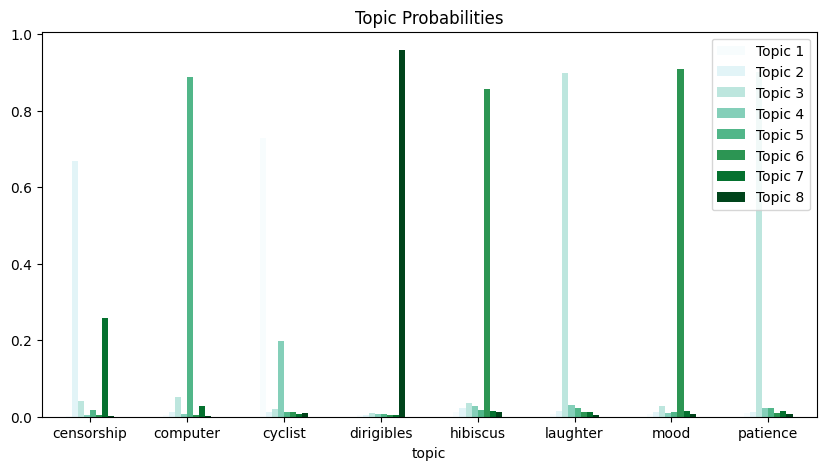

In [25]:
train_predictions = lda_base_model.transform(lemma_matrix)
train_evaluation = pd.DataFrame(train_predictions, columns=topic_labels, index=training_data.topic)
train_evaluation.sample(10)

train_evaluation.groupby(level='topic').mean().plot.bar(title='Topic Probabilities', rot=0, colormap='BuGn', figsize=(10,5));

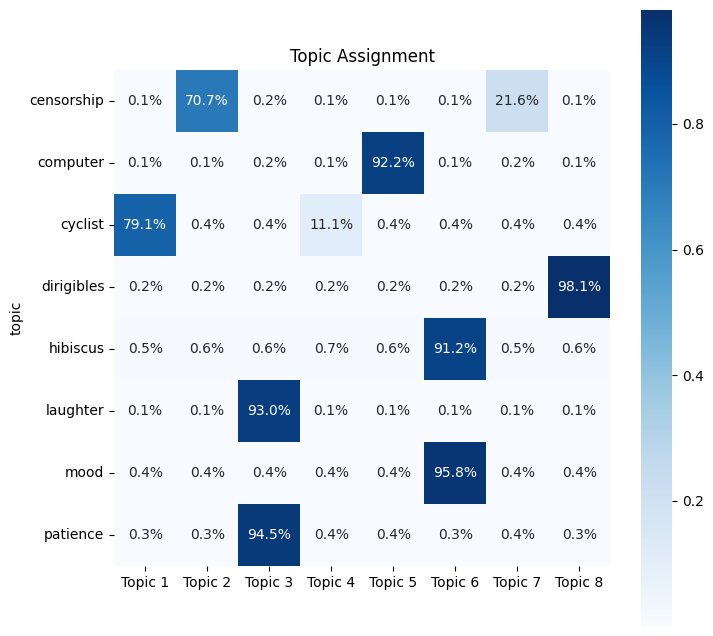

In [26]:
# generating heatmap for topic assignments

df = train_evaluation.groupby(level='topic').agg('median')
fig, ax = plt.subplots(figsize=(8,8))
g = sns.heatmap(df, annot=True, fmt='.1%', annot_kws={"size": 10}, cmap='Blues', square=True)
loc, labels = plt.yticks()
g.set_yticklabels(labels, rotation=0)
g.set_title('Topic Assignment');

In [27]:
df = train_evaluation.idxmax(axis=1).reset_index().groupby('topic', as_index=False).agg(lambda x:x.value_counts().index[0]).rename(columns={0:'assignment'})
df

,topic,assignment
0,censorship,Topic 2
1,computer,Topic 5
2,cyclist,Topic 1
3,dirigibles,Topic 8
4,hibiscus,Topic 6
5,laughter,Topic 3
6,mood,Topic 6
7,patience,Topic 3


### Visualization with PyLDAVis

In [28]:
import pyLDAvis
from pyLDAvis.lda_model import prepare
pyLDAvis.enable_notebook()
plt.rcParams['figure.figsize'] = [8, 5]
plt.rcParams['figure.dpi'] = 100

# fitting base model
prepare(lda_base_model, lemma_matrix, count_vectorizer)

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
2     -0.034704 -0.067374       1        1  22.324508
4     -0.091398  0.027034       2        1  21.312018
1     -0.191807  0.036687       3        1  16.244038
7      0.209121  0.332134       4        1  12.633517
5      0.003794 -0.023115       5        1  12.081971
6     -0.250719  0.025862       6        1   6.817091
0      0.225133 -0.131811       7        1   5.732933
3      0.130580 -0.199418       8        1   2.853924, topic_info=           Term          Freq         Total Category  logprob  loglift
361    computer  20353.000000  20353.000000  Default  30.0000  30.0000
201        book  14010.000000  14010.000000  Default  29.0000  29.0000
228    building   7814.000000   7814.000000  Default  28.0000  28.0000
520   dirigible   6218.000000   6218.000000  Default  27.0000  27.0000
308       child   5831.000000   5831.000000  Default  26.0000  26.0000
...         ...           ...           ...      ...      ...      ...
1022      leave    211.269755   2426.313650   Topic8  -4.7520   1.1155
389    continue    143.270136    479.225065   Topic8  -5.1404   2.3490
1318      place    172.785279   3377.829783   Topic8  -4.9530   0.5835
707     finally    155.696633   1618.166980   Topic8  -5.0572   1.2153
601         end    156.285386   2304.432331   Topic8  -5.0534   0.8656

[504 rows x 6 columns], token_table=      Topic      Freq     Term
term                          
3         4  0.028553  abandon
3         7  0.277370  abandon
3         8  0.689345  abandon
4         3  0.988640    abhor
6         1  0.122645     able
...     ...       ...      ...
1996      2  0.043370    young
1996      3  0.064721    young
1996      5  0.050709    young
1996      6  0.694582    young
1996      8  0.037365    young

[1315 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[3, 5, 2, 8, 6, 7, 1, 4])

In [29]:
hibiscus = training_data[training_data.topic == 'hibiscus']

# Split essays into training and test sets
train_essays, test_essays = train_test_split(hibiscus, stratify=hibiscus.target_score, test_size=0.2, random_state=42)
print(train_essays, test_essays)

count_vectorizer = CountVectorizer(max_df=.2, min_df=3, stop_words=list(STOP_WORDS), max_features=399)

# Train and test lemma matrices
train_lm = count_vectorizer.fit_transform(train_essays.l_essay)
test_lm = count_vectorizer.fit_transform(test_essays.l_essay)

lda_score = LatentDirichletAllocation(n_components=4, n_jobs=-1, learning_method='batch', evaluate_every=5, verbose=0, max_iter=500)
lda_score.fit(train_lm)

# save training model
joblib.dump(lda_score, 'lda_score.pkl')

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
/usr/local/lib/python3.10/dist-packages/sklearn/feature_extraction/text.py:408: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ll', 've'] not in stop_words.
  warnings.warn(


      essay_id     topic                                              essay  \
5663      9218  hibiscus  The author concludes the story with that parag...   
5485      9039  hibiscus  The last sentence of a story is usually the mo...   
6150      9707  hibiscus  The author concludes the story with this parag...   
5704      9259  hibiscus  The author ends the story with this paragraph ...   
5509      9063  hibiscus  The auther cncludes the story with this paragr...   
...        ...       ...                                                ...   
6768     10329  hibiscus  She is  saying that ryt now, is not the right ...   
6126      9683  hibiscus  Minfong tto ended the story with aphrase dialo...   
6125      9682  hibiscus  The author concludes the story with that parag...   
5932      9488  hibiscus  The author concludes this story with the parag...   
6746     10307  hibiscus  The author concludes the story with that parag...   

      rater1_domain1  rater2_domain1  rater3_domain

['lda_score.pkl']

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


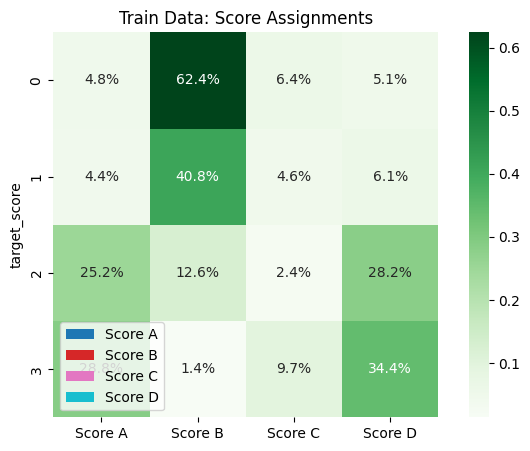

In [30]:
# Analyzing and Visualizing LDA Topic Model Results
topic_labels = ['Score A', 'Score B', 'Score C', 'Score D']

train_predictions = lda_score.transform(train_lm)
train_evaluation = pd.DataFrame(train_predictions, columns=topic_labels, index=train_essays.target_score)
train_evaluation.sample(5)

train_evaluation.groupby(level='target_score').mean().plot.bar(title='Avg. Topic Probabilities', rot=0, colormap='tab10', figsize=(8,5));

df = train_evaluation.groupby(level='target_score').agg('median')
sns.heatmap(df, annot=True, fmt='.1%', cmap='Greens', square=True)
plt.title('Train Data: Score Assignments');

In [31]:
df = train_evaluation.idxmax(axis=1).reset_index().groupby('target_score', as_index=False).agg(lambda x:x.value_counts().index[0]).rename(columns={0:'assignment'})
df

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,target_score,assignment
0,0,Score B
1,1,Score B
2,2,Score A
3,3,Score D


In [32]:
test_prediction = lda_score.transform(test_lm)
test_evaluation = pd.DataFrame(test_prediction, columns=topic_labels, index=test_essays.target_score)
test_evaluation.head()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,Score A,Score B,Score C,Score D
target_score,,,,
1,0.449024,0.320598,0.205526,0.024853
2,0.315985,0.448065,0.219236,0.016714
1,0.036606,0.324507,0.038118,0.600769
1,0.195110,0.558063,0.225014,0.021812
0,0.083633,0.084279,0.090344,0.741744


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


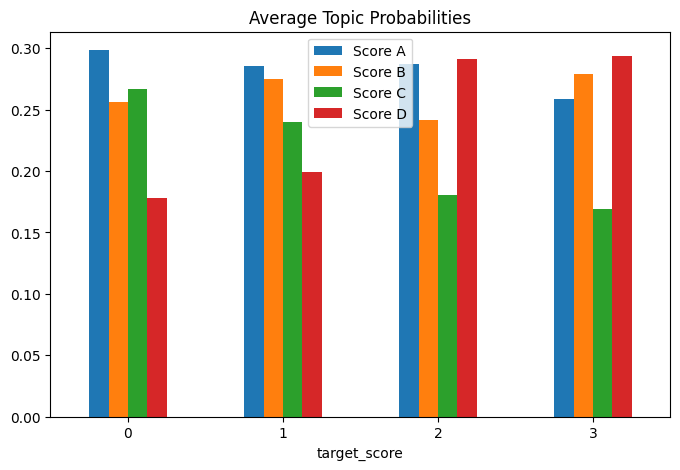

In [33]:
test_evaluation.groupby(level='target_score').mean().plot.bar(title='Average Topic Probabilities', rot=0);


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


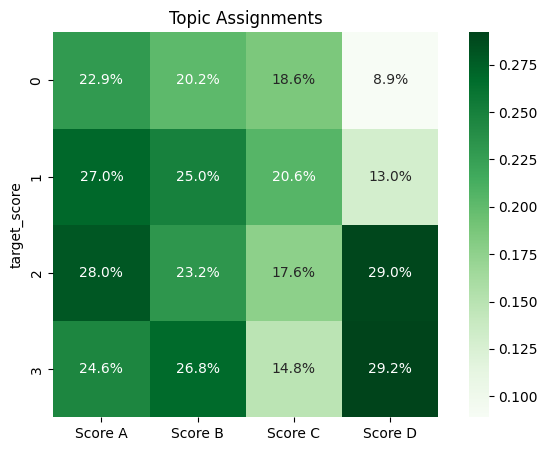

In [34]:
df = test_evaluation.groupby(level='target_score').agg('median')
sns.heatmap(df, annot=True, fmt='.1%', cmap='Greens', square=True)
plt.title('Topic Assignments')
plt.show()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


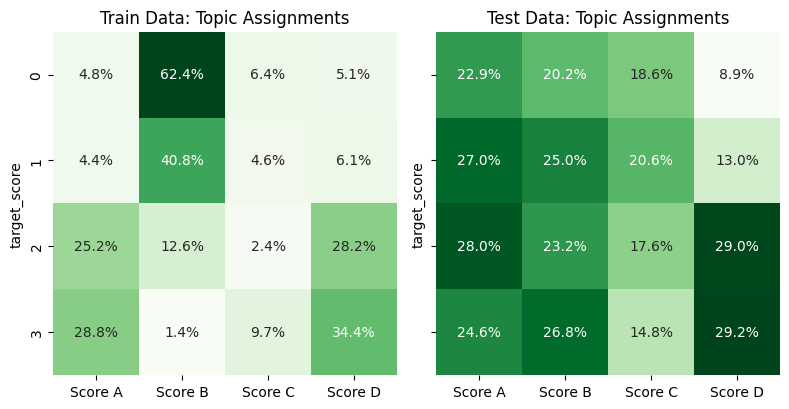

In [37]:
fig, axes = plt.subplots(ncols=2, figsize=(8,6), sharey=True)
source = ['Train', 'Test']
for i, df in enumerate([train_evaluation, test_evaluation]):
    df = df.groupby(level='target_score').agg('median')
    sns.heatmap(df, annot=True, fmt='.1%', cmap='Greens', square=True, ax=axes[i], cbar=False)
    axes[i].set_title('{} Data: Topic Assignments'.format(source[i]))
plt.tight_layout()
plt.show()

## Scoring Leveraging Neural Networks Models

In [38]:
# Import necessary modules
from sklearn.model_selection import cross_val_score, KFold
from nltk.corpus import stopwords
import language_tool_python
import spacy

from sklearn.model_selection import train_test_split, KFold
from skll.metrics import kappa
from scipy.sparse import csr_matrix
import scikeras
import tensorflow
import nltk

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [39]:
import language_tool_python

def correct_language(data):
  tool = language_tool_python.LanguageTool('en-US')
  data['matches'] = data['essay'].apply(lambda txt: tool.check(txt))
  data['corrections'] = data.apply(lambda l: len(l['matches']), axis=1)
  data['corrected'] = data.apply(lambda l:  tool.correct(l['essay']), axis=1)

  return data

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
# Prepare combined dataset from validation and test dataset

validation_data  = pd.read_csv('validation_data.tsv', sep='\t', encoding = "ISO-8859-1").rename(columns={'essay_set': 'topic'})

testing_data  = pd.read_csv('testing_data.tsv', sep='\t', encoding = "ISO-8859-1").rename(columns={'essay_set': 'topic'})

combined_data = pd.concat([validation_data, testing_data], sort=False)

# applying corrections
combined_data = correct_language(combined_data)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
# Combining training dataset
combined_data = pd.concat([combined_data, training_data], sort=False)

combined_data.to_pickle('combined_dataset.pkl')

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [40]:
import pandas as pd
combined_data = pd.read_pickle('combined_dataset.pkl')

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)



#### Generate word embeddings with Word2Vec
###### Generating word embedding with 2-layer NN word2vec to obtain vector representation of words

In [57]:
import string
# Clean training_set essays before feeding them to the Word2Vec model.
punctuations = string.punctuation

print(stop_words, punctuations)

{'hereby', 'seeming', '’m', '’d', 'wherever', 'up', 'down', 'by', 'yourselves', 'never', 'must', 'hereupon', 'enough', 'if', 'under', 'your', 'has', 'latter', 'any', 'whoever', '|', 'back', 'although', '-', 'also', 'whatever', ')', '*', 'a', 'many', 'to', 'upon', '(', 'eleven', 'between', "'ve", 'always', 'per', 'it', 'do', 'else', 'used', 'across', 'seems', 'too', 'this', 'ours', 'first', 'no', 'those', 'might', 'only', 'became', 'who', 'fifteen', 'mine', 'they', 'much', 'why', 'was', 'whereupon', 'out', '\\', 'last', 'during', 'he', 'alone', 'against', 'thereupon', 'with', 'say', 'another', 'next', '=', 'in', 'one', 'nor', 'thus', 'anyway', 'whether', '{', 'show', "n't", 'about', '[', 'themselves', 'therein', 'after', 'or', 'noone', '’s', 'for', 'becoming', 'nothing', 'see', 'being', 'than', '‘m', 'n’t', 'everything', 'same', 'nevertheless', 'own', 'myself', 'most', '}', 'but', 'twelve', 'least', 'rather', '‘d', 'were', 'throughout', 'again', 'just', ':', 'further', 'would', '+', 'ex

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [42]:
# Removing pronouns, stopwords and punctuations from the essay
def clean_text(essays, logging=False):
    texts = []
    counter = 1
    for essay in essays.corrected:
        if counter % 2000 == 0 and logging:
            print("Processed %d out of %d documents." % (counter, len(essays)))
        counter += 1
        essay = nlp(essay, disable=['parser', 'ner'])
        tokens = [tok.lemma_.lower().strip() for tok in essay if tok.lemma_ != '-PRON-']
        tokens = [tok for tok in tokens if tok not in stop_words and tok not in punctuations]
        tokens = ' '.join(tokens)
        texts.append(tokens)
    return pd.Series(texts)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [43]:
# Cleanup text and make sure it retains original shape

training_cleaned_dataset = clean_text(training_data, logging=True)
print(training_cleaned_dataset.shape)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Processed 2000 out of 12974 documents.
Processed 4000 out of 12974 documents.
Processed 6000 out of 12974 documents.
Processed 8000 out of 12974 documents.
Processed 10000 out of 12974 documents.
Processed 12000 out of 12974 documents.
(12974,)


In [44]:
# Reference: https://github.com/Turanga1/Automated-Essay-Scoring/blob/master/2_Automatic_Scoring_with_Neural_Networks.ipynb

# preprocessing text from the essays using Word2Vec
import re
def clean_text_word2vec(essays, logging=False):
    sentences = []
    counter = 1
    for essay in essays:
        if counter % 2000 == 0 and logging:
            print("Processing %d out of %d documents" % (counter, len(essays)))
        # Disable tagger so that lemma_ of personal pronouns (I, me, etc) don't getted marked as "-PRON-"
        essay = nlp(essay, disable=['tagger'])
        # Grab lemmatized form of words and make lowercase
        essay = " ".join([tok.lemma_.lower() for tok in essay])
        # Split into sentences based on punctuation
        essay = re.split("[\.?!;] ", essay)
        # Remove commas, periods, and other punctuation (mostly commas)
        essay = [re.sub("[\.,;:!?]", "", sent) for sent in essay]
        # Split into words
        essay = [sent.split() for sent in essay]
        sentences += essay
        counter += 1
    return sentences

cleaned_word2vec = clean_text_word2vec(combined_data['corrected'], logging=True)
print('Cleaned up training data size (i.e. number of sentences): ', len(cleaned_word2vec))

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
<>:16: DeprecationWarning: invalid escape sequence '\.'
<>:18: DeprecationWarning: invalid escape sequence '\.'
<>:16: DeprecationWarning: invalid escape sequence '\.'
<>:18: DeprecationWarning: invalid escape sequence '\.'
<ipython-input-44-699fc0bee314>:16: DeprecationWarning: invalid escape sequence '\.'
  essay = re.split("[\.?!;] ", essay)
<ipython-input-44-699fc0bee314>:18: DeprecationWarning: invalid escape sequence '\.'
  essay = [re.sub("[\.,;:!?]", "", sent) for sent in essay]
/usr/local/lib/python3.10/dist-packages/spacy/pipeline/lemmatizer.py:211: UserWarning: [W108] The rule-based lemmatizer did not find POS annotation for o

Processing 2000 out of 21445 documents
Processing 4000 out of 21445 documents
Processing 6000 out of 21445 documents
Processing 8000 out of 21445 documents
Processing 10000 out of 21445 documents
Processing 12000 out of 21445 documents
Processing 14000 out of 21445 documents
Processing 16000 out of 21445 documents
Processing 18000 out of 21445 documents
Processing 20000 out of 21445 documents
Cleaned up training data size (i.e. number of sentences):  291659


In [45]:
# tuning model paramerters

from gensim.models.word2vec import Word2Vec

text_dimensionality = 400

word2vec_model = Word2Vec(cleaned_word2vec,
                         vector_size = text_dimensionality,
                         window = 3,
                         min_count = 5,
                         workers = 4,
                         sg = 1)

print("%d unique words represented by %d dimensional vectors" % (len(word2vec_model.wv.index_to_key), text_dimensionality))
word2vec_model.save('wordvec_model')

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


11055 unique words represented by 400 dimensional vectors


In [46]:
from gensim.models.word2vec import Word2Vec
text_dimensionality = 400
word2vec_model = Word2Vec.load('wordvec_model')

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [47]:
# Creating averaged word vectors for a cleaned text.
import numpy as np
def create_average_vec(essay):
    average = np.zeros((text_dimensionality,), dtype='float32')
    num_words = 0.
    for word in essay.split():
        if word in word2vec_model.wv.index_to_key:
            average = np.add(average, word2vec_model.wv[word])
            num_words += 1.
    if num_words != 0.:
        average = np.divide(average, num_words)
    return average

cleaned_vector = np.zeros((training_data.shape[0], text_dimensionality), dtype="float32")
for i in range(len(training_cleaned_dataset)):
    cleaned_vector[i] = create_average_vec(training_cleaned_dataset[i])

print("Word Cleaned vectors - shape:", cleaned_vector.shape)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Word Cleaned vectors - shape: (12974, 400)


In [48]:
from sklearn.preprocessing import MinMaxScaler,StandardScaler
# reading generated features from features pickle file
additional_features = pd.read_pickle('training_features.pkl')

# Selecting features from Gini feature importances
feature_list = [
                'word_count',
                'corrections',
                'similarity',
                'token_count',
                'unique_token_count',
                'nostop_count',
                'sent_count',
                'ner_count',
                'comma',
                'question',
                'exclamation',
                'quotation',
                'organization',
                'caps',
                'person',
                'location',
                'money',
                'time',
                'date',
                'percent',
                'noun',
                'adj',
                'pron',
                'verb',
                'cconj',
                'adv',
                'det',
                'propn',
                'num',
                'part',
                'intj'
                ]

additional_features = additional_features[feature_list]

standardscaler = StandardScaler()
additional_features = standardscaler.fit_transform(additional_features)
additional_features.shape

# Combine topic number, target score, additional features and cleaned word vectors
entire_data = pd.concat([training_data[['topic','target_score']], pd.DataFrame(additional_features), pd.DataFrame(cleaned_vector)], axis=1)
entire_data.shape

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


(12974, 433)

### Approach 1: Passing Each Topic Individually through Model


In [58]:
from keras.models import Sequential, Model
from keras.layers import Dense, Dropout, Input, LSTM, Bidirectional, Flatten
from keras.layers import Conv1D, MaxPooling1D, GlobalMaxPooling1D
from keras.optimizers import Adam


# Building the neural network model
output_dimension = 1
input_dimension = entire_data.shape[1]-2
dropout = 0.2

# Initializing the model
model = None
model = Sequential()

# Densely Connected Neural Network
model.add(Dense(14,
                activation='relu',
                kernel_initializer='he_normal',
                input_dim = input_dimension))
model.add(Dropout(dropout))

# model.add(Dense(8, activation='relu', kernel_initializer='he_normal'))
# model.add(Dropout(dropout))

model.add(Dense(output_dimension))
model.summary()

# Compiling the neural network model with adam optimizer
adam = Adam(learning_rate=0.0001, beta_1=0.9, beta_2=0.999, epsilon=1e-5) # 1e-7

model.compile(optimizer=adam, loss='mean_squared_error', metrics=['mse','mae'])

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4 (Dense)                      │ (None, 14)                  │           6,048 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 14)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ (None, 1)                   │              15 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,063 (23.68 KB)

 Trainable params: 6,063 (23.68 KB)

 Non-trainable params: 0 (0.00 B)

In [50]:
# Reference: https://github.com/Turanga1/Automated-Essay-Scoring/blob/master/bhkappa.py
import numpy as np
# kappa scoring function
def mean_quadratic_weighted_kappa(kappas, weights=None):

    kappas = np.array(kappas, dtype=float)
    if weights is None:
        weights = np.ones(np.shape(kappas))
    else:
        weights = weights / np.mean(weights)

    # ensure that kappas are in the range [-.999, .999]
    kappas = np.array([min(x, .999) for x in kappas])
    kappas = np.array([max(x, -.999) for x in kappas])

    z = 0.5 * np.log((1 + kappas) / (1 - kappas)) * weights
    z = np.mean(z)
    return (np.exp(2 * z) - 1) / (np.exp(2 * z) + 1)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [59]:
# Initialize lists to store kappa scores and weights
kappa_list = []
weights = []
epochs = 100

# Iterate over each topic
for topic in entire_data.topic.unique():
    # Split data for the current topic
    X = entire_data[entire_data.topic == topic].drop(['topic', 'target_score'], axis=1)
    y = entire_data[entire_data.topic == topic].target_score.to_frame()
    #X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, train_size=0.8, random_state=26)
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=26)
    print(X_train.shape)
    print(y_train.shape)
    print(X_train.isnull().values.any())
    print(y_train.isnull().values.any())
    # Fit the model to the training data
    estimator = model.fit(X_train, y_train, epochs=epochs, batch_size=16)

    # Check if model training failed
    if estimator is None:
        print("Model training failed for topic:", topic)
        continue

    # Make predictions on the test data
    y_pred = pd.DataFrame(model.predict(X_test).reshape(-1))
    print(y_pred)
    # Compute kappa score for the current topic
    kappa_list.append(kappa(y_test.values, y_pred.round(0).astype(int).values, weights='quadratic'))

    # Calculate weight for the current topic
    weights.append(y_test.shape[0] / entire_data.shape[0])

# Calculate weighted average kappa
qwk = mean_quadratic_weighted_kappa(kappa_list, weights=1)
print('Combined Kappa score: {:.2f}%'.format(qwk * 100))


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


(1426, 431)
(1426, 1)
False
False
Epoch 1/100
90/90 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 72.8676 - mae: 8.3899 - mse: 72.8676
Epoch 2/100
90/90 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 54.1314 - mae: 7.2240 - mse: 54.1314
Epoch 3/100
90/90 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 39.6014 - mae: 6.1631 - mse: 39.6014
Epoch 4/100
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 27.8126 - mae: 5.1152 - mse: 27.8126
Epoch 5/100
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 19.7715 - mae: 4.2380 - mse: 19.7715
Epoch 6/100
90/90 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 13.0456 - mae: 3.3411 - mse: 13.0456
Epoch 7/100
90/90 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 9.3866 - mae: 2.7188 - mse: 9.3866
Epoch 8/100
90/90 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 6.7334 - mae: 2.1871 - mse: 6.7334
Epoch 9/100
90/90 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 5.5785 - mae: 1.9690 - mse: 5.5785
Epoch 10/100
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 4.8474 - mae: 1.7718 - mse: 4.8474
Epoch 11/100


/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.

Epoch 1/100
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 13.6993 - mae: 3.2130 - mse: 13.6993
Epoch 2/100
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1576 - mae: 0.8675 - mse: 1.1576
Epoch 3/100
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.0244 - mae: 0.8092 - mse: 1.0244
Epoch 4/100
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.9718 - mae: 0.7831 - mse: 0.9718
Epoch 5/100
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.9305 - mae: 0.7682 - mse: 0.9305
Epoch 6/100
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8502 - mae: 0.7334 - mse: 0.8502
Epoch 7/100
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7872 - mae: 0.7049 - mse: 0.7872
Epoch 8/100
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7345 - mae: 0.6791 - mse: 0.7345
Epoch 9/100
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.7134 - mae: 0.6750 - mse: 0.7134
Epoch 10/100
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.6508 - mae: 0.6309 - mse: 0.6508
Epoch 11/100
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - los

/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.

Epoch 1/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5412 - mae: 0.5828 - mse: 0.5412
Epoch 2/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4427 - mae: 0.5254 - mse: 0.4427
Epoch 3/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4067 - mae: 0.5093 - mse: 0.4067
Epoch 4/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4239 - mae: 0.5179 - mse: 0.4239
Epoch 5/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4298 - mae: 0.5170 - mse: 0.4298
Epoch 6/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3923 - mae: 0.5026 - mse: 0.3923
Epoch 7/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3995 - mae: 0.5040 - mse: 0.3995
Epoch 8/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4148 - mae: 0.5083 - mse: 0.4148
Epoch 9/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3720 - mae: 0.4747 - mse: 0.3720
Epoch 10/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3479 - mae: 0.4704 - mse: 0.3479
Epoch 11/100
87/87 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss:

/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.

Epoch 1/100
89/89 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4169 - mae: 0.5088 - mse: 0.4169
Epoch 2/100
89/89 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3804 - mae: 0.4858 - mse: 0.3804
Epoch 3/100
89/89 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3462 - mae: 0.4517 - mse: 0.3462
Epoch 4/100
89/89 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3631 - mae: 0.4674 - mse: 0.3631
Epoch 5/100
89/89 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3504 - mae: 0.4630 - mse: 0.3504
Epoch 6/100
89/89 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3334 - mae: 0.4570 - mse: 0.3334
Epoch 7/100
89/89 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3214 - mae: 0.4446 - mse: 0.3214
Epoch 8/100
89/89 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3455 - mae: 0.4630 - mse: 0.3455
Epoch 9/100
89/89 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3432 - mae: 0.4527 - mse: 0.3432
Epoch 10/100
89/89 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3277 - mae: 0.4498 - mse: 0.3277
Epoch 11/100
89/89 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss:

/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.

Epoch 1/100
91/91 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.5914 - mae: 0.6210 - mse: 0.5914
Epoch 2/100
91/91 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4493 - mae: 0.5389 - mse: 0.4493
Epoch 3/100
91/91 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4047 - mae: 0.5074 - mse: 0.4047
Epoch 4/100
91/91 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4044 - mae: 0.5077 - mse: 0.4044
Epoch 5/100
91/91 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3866 - mae: 0.4940 - mse: 0.3866
Epoch 6/100
91/91 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3844 - mae: 0.5005 - mse: 0.3844
Epoch 7/100
91/91 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4004 - mae: 0.4974 - mse: 0.4004
Epoch 8/100
91/91 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3562 - mae: 0.4747 - mse: 0.3562
Epoch 9/100
91/91 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3555 - mae: 0.4644 - mse: 0.3555
Epoch 10/100
91/91 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3930 - mae: 0.4908 - mse: 0.3930
Epoch 11/100
91/91 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss:

/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.

Epoch 1/100
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5352 - mae: 0.5703 - mse: 0.5352
Epoch 2/100
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4824 - mae: 0.5466 - mse: 0.4824
Epoch 3/100
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4607 - mae: 0.5297 - mse: 0.4607
Epoch 4/100
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4474 - mae: 0.5368 - mse: 0.4474
Epoch 5/100
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4351 - mae: 0.5184 - mse: 0.4351
Epoch 6/100
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4400 - mae: 0.5280 - mse: 0.4400
Epoch 7/100
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4622 - mae: 0.5290 - mse: 0.4622
Epoch 8/100
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4071 - mae: 0.4967 - mse: 0.4071
Epoch 9/100
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4243 - mae: 0.5097 - mse: 0.4243
Epoch 10/100
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4063 - mae: 0.5036 - mse: 0.4063
Epoch 11/100
90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss:

/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.

Epoch 1/100
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 220.4214 - mae: 14.2008 - mse: 220.4214
Epoch 2/100
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 117.7706 - mae: 10.0098 - mse: 117.7706
Epoch 3/100
79/79 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 72.8270 - mae: 7.5298 - mse: 72.8270
Epoch 4/100
79/79 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 49.9596 - mae: 5.9591 - mse: 49.9596
Epoch 5/100
79/79 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 37.8104 - mae: 5.1100 - mse: 37.8104
Epoch 6/100
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 28.2747 - mae: 4.3237 - mse: 28.2747
Epoch 7/100
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 25.3269 - mae: 4.0440 - mse: 25.3269
Epoch 8/100
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 23.3351 - mae: 3.9295 - mse: 23.3351
Epoch 9/100
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 21.6191 - mae: 3.7463 - mse: 21.6191
Epoch 10/100
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 21.8464 - mae: 3.7816 - mse: 21.8464
Epoch 11/100
79/79 ━━━━━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.

Epoch 1/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 158.9379 - mae: 11.0146 - mse: 158.9379
Epoch 2/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 86.1616 - mae: 7.6090 - mse: 86.1616
Epoch 3/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 85.4089 - mae: 7.5788 - mse: 85.4089
Epoch 4/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 84.7526 - mae: 7.3215 - mse: 84.7526
Epoch 5/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 79.1353 - mae: 6.8716 - mse: 79.1353
Epoch 6/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 81.4184 - mae: 7.4398 - mse: 81.4184
Epoch 7/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 72.5176 - mae: 6.8311 - mse: 72.5176
Epoch 8/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 72.9042 - mae: 6.7142 - mse: 72.9042
Epoch 9/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 63.5305 - mae: 6.3538 - mse: 63.5305
Epoch 10/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 75.2091 - mae: 6.9709 - mse: 75.2091
Epoch 11/100
37/37 ━━━━━━━━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.

In [ ]:
# Computting each topic individually
kappa_list = []
weights = []
epochs = 100

for topic in entire_data.topic.unique():
    # split data
    X = entire_data[entire_data.topic == topic].drop(['topic', 'target_score'], axis=1)
    y = entire_data[entire_data.topic == topic].target_score.to_frame()
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=26)
    print(X_train.shape)
    print(y_train.shape)
    estimator = model.fit(X_train, y_train,epochs=epochs, batch_size=16)
    if estimator is None:
        print("Model training failed for topic:", topic)
        continue

    y_pred = pd.DataFrame(model.predict(X_test).reshape(-1))
    print(y_pred)
    kappa_list.append(kappa(y_test.values, y_pred.round(0).astype(int).values, weights='quadratic'))

    weights.append(y_test.shape[0]/entire_data.shape[0])

# get weighted average kappa
qwk = mean_quadratic_weighted_kappa(kappa_list, weights=1) # weights)
print('Combined Kappa score: {:.2f}%'.format(qwk * 100))

(1426, 431)
(1426, 1)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Epoch 1/100
96/96 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 414.6024 - mae: 18.9861 - mse: 414.6024
Epoch 2/100
96/96 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 276.8159 - mae: 15.2241 - mse: 276.8159
Epoch 3/100
96/96 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 199.4620 - mae: 12.7064 - mse: 199.4620
Epoch 4/100
96/96 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 137.6754 - mae: 10.4600 - mse: 137.6754
Epoch 5/100
96/96 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 94.8388 - mae: 8.3866 - mse: 94.8388
Epoch 6/100
96/96 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 69.4559 - mae: 7.0480 - mse: 69.4559
Epoch 7/100
96/96 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 63.8923 - mae: 6.8603 - mse: 63.8923
Epoch 8/100
96/96 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 54.1056 - mae: 6.2297 - mse: 54.1056
Epoch 9/100
96/96 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 53.9140 - mae: 6.3094 - mse: 53.9140
Epoch 10/100
96/96 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 46.9523 - mae: 5.8312 - mse: 46.9523
Epoch 11/100
96/96 ━━━━━━━━

/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.

(1440, 431)
(1440, 1)
Epoch 1/100
96/96 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 16.8506 - mae: 3.7373 - mse: 16.8506
Epoch 2/100
96/96 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 4.9513 - mae: 1.9069 - mse: 4.9513
Epoch 3/100
96/96 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.0375 - mae: 1.1464 - mse: 2.0375
Epoch 4/100
96/96 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.4289 - mae: 0.9543 - mse: 1.4289
Epoch 5/100
96/96 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0609 - mae: 0.8209 - mse: 1.0609
Epoch 6/100
96/96 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9372 - mae: 0.7676 - mse: 0.9372
Epoch 7/100
96/96 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8386 - mae: 0.7061 - mse: 0.8386
Epoch 8/100
96/96 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7525 - mae: 0.6920 - mse: 0.7525
Epoch 9/100
96/96 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6893 - mae: 0.6552 - mse: 0.6893
Epoch 10/100
96/96 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6067 - mae: 0.6149 - mse: 0.6067
Epoch 11/100
96/96 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.

Epoch 1/100
92/92 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.7339 - mae: 1.0511 - mse: 1.7339
Epoch 2/100
92/92 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.8248 - mae: 0.7264 - mse: 0.8248
Epoch 3/100
92/92 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.6680 - mae: 0.6413 - mse: 0.6680
Epoch 4/100
92/92 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.5927 - mae: 0.6063 - mse: 0.5927
Epoch 5/100
92/92 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6485 - mae: 0.6255 - mse: 0.6485
Epoch 6/100
92/92 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5775 - mae: 0.5913 - mse: 0.5775
Epoch 7/100
92/92 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6197 - mae: 0.6042 - mse: 0.6197
Epoch 8/100
92/92 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5237 - mae: 0.5488 - mse: 0.5237
Epoch 9/100
92/92 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5354 - mae: 0.5631 - mse: 0.5354
Epoch 10/100
92/92 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5219 - mae: 0.5718 - mse: 0.5219
Epoch 11/100
92/92 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss:

/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.

(1414, 431)
(1414, 1)
Epoch 1/100
95/95 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5032 - mae: 0.5470 - mse: 0.5032
Epoch 2/100
95/95 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5287 - mae: 0.5640 - mse: 0.5287
Epoch 3/100
95/95 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4837 - mae: 0.5416 - mse: 0.4837
Epoch 4/100
95/95 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.5266 - mae: 0.5566 - mse: 0.5266
Epoch 5/100
95/95 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4529 - mae: 0.5269 - mse: 0.4529
Epoch 6/100
95/95 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4803 - mae: 0.5410 - mse: 0.4803
Epoch 7/100
95/95 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4813 - mae: 0.5350 - mse: 0.4813
Epoch 8/100
95/95 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4614 - mae: 0.5198 - mse: 0.4614
Epoch 9/100
95/95 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4652 - mae: 0.5248 - mse: 0.4652
Epoch 10/100
95/95 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4282 - mae: 0.5150 - mse: 0.4282
Epoch 11/100
95/95 ━━━━━━━━━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.

(1444, 431)
(1444, 1)
Epoch 1/100
97/97 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.6421 - mae: 0.6423 - mse: 0.6421
Epoch 2/100
97/97 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4189 - mae: 0.5130 - mse: 0.4189
Epoch 3/100
97/97 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3978 - mae: 0.4961 - mse: 0.3978
Epoch 4/100
97/97 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4006 - mae: 0.5068 - mse: 0.4006
Epoch 5/100
97/97 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3540 - mae: 0.4732 - mse: 0.3540
Epoch 6/100
97/97 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3551 - mae: 0.4721 - mse: 0.3551
Epoch 7/100
97/97 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3263 - mae: 0.4564 - mse: 0.3263
Epoch 8/100
97/97 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3645 - mae: 0.4745 - mse: 0.3645
Epoch 9/100
97/97 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3971 - mae: 0.4955 - mse: 0.3971
Epoch 10/100
97/97 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3262 - mae: 0.4568 - mse: 0.3262
Epoch 11/100
97/97 ━━━━━━━━━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.

(1440, 431)
(1440, 1)
Epoch 1/100
96/96 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4443 - mae: 0.5176 - mse: 0.4443
Epoch 2/100
96/96 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3831 - mae: 0.4872 - mse: 0.3831
Epoch 3/100
96/96 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3902 - mae: 0.4854 - mse: 0.3902
Epoch 4/100
96/96 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3635 - mae: 0.4795 - mse: 0.3635
Epoch 5/100
96/96 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.3834 - mae: 0.4719 - mse: 0.3834
Epoch 6/100
96/96 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3587 - mae: 0.4758 - mse: 0.3587
Epoch 7/100
96/96 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3369 - mae: 0.4504 - mse: 0.3369
Epoch 8/100
96/96 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3429 - mae: 0.4540 - mse: 0.3429
Epoch 9/100
96/96 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3715 - mae: 0.4751 - mse: 0.3715
Epoch 10/100
96/96 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3493 - mae: 0.4532 - mse: 0.3493
Epoch 11/100
96/96 ━━━━━━━━━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.

(1255, 431)
(1255, 1)
Epoch 1/100
84/84 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 217.8042 - mae: 14.1730 - mse: 217.8042
Epoch 2/100
84/84 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 169.7726 - mae: 12.4078 - mse: 169.7726
Epoch 3/100
84/84 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 148.5268 - mae: 11.5337 - mse: 148.5268
Epoch 4/100
84/84 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 126.8395 - mae: 10.5206 - mse: 126.8395
Epoch 5/100
84/84 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 110.8758 - mae: 9.7239 - mse: 110.8758
Epoch 6/100
84/84 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 97.8074 - mae: 9.0330 - mse: 97.8074
Epoch 7/100
84/84 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 89.3463 - mae: 8.5235 - mse: 89.3463
Epoch 8/100
84/84 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 79.4316 - mae: 7.8991 - mse: 79.4316
Epoch 9/100
84/84 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 70.9750 - mae: 7.4310 - mse: 70.9750
Epoch 10/100
84/84 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 67.2223 - mae: 7.0429 - mse: 67.2223
Epo

/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.

Epoch 1/100
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 214.9328 - mae: 12.3776 - mse: 214.9328
Epoch 2/100
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 208.2594 - mae: 11.6664 - mse: 208.2594
Epoch 3/100
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 212.6966 - mae: 11.7926 - mse: 212.6966
Epoch 4/100
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 170.8591 - mae: 10.4527 - mse: 170.8591
Epoch 5/100
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 164.4813 - mae: 10.1961 - mse: 164.4813
Epoch 6/100
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 187.4212 - mae: 10.7705 - mse: 187.4212
Epoch 7/100
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 188.2015 - mae: 10.7396 - mse: 188.2015
Epoch 8/100
39/39 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 174.6957 - mae: 10.4926 - mse: 174.6957
Epoch 9/100
39/39 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - loss: 169.7953 - mae: 10.3344 - mse: 169.7953
Epoch 10/100
39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 170.6581 - mae: 10.4551 - mse: 170.6581
Epoch 

/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.

In [60]:
# Cross-validation

kappa_dict = {}

for topic in entire_data.topic.unique():

    model = None
    # create model
    model = Sequential()
    model.add(Dense(14, input_dim=input_dimension, kernel_initializer='he_normal', activation='relu'))
    model.add(Dropout(dropout))
    model.add(Dense(1))
    # Compile model
    model.compile(loss='mean_squared_error', optimizer='adam')

    X = entire_data[entire_data.topic == topic].drop(['topic', 'target_score'], axis=1)
    y = entire_data[entire_data.topic == topic].target_score.to_frame()
    # split data
    kf = KFold(n_splits=5, shuffle=True, random_state=26)
    kappa_list = []
    for train, test in kf.split(X):
        X_train, X_test = X.iloc[train], X.iloc[test]
        y_train, y_test = y.iloc[train], y.iloc[test]
        model.fit(X_train, y_train, epochs=100, batch_size=15, verbose=0)
        y_pred = pd.DataFrame(model.predict(X_test).reshape(-1))
        print(y_pred)
        kappa_list.append(kappa(y_pred.round(0).astype(int).values,
                        y.iloc[test].values,
                        weights='quadratic'))
    print("Kappa for topic", topic, ": {:.3f}%".format(np.mean(kappa_list)))
    kappa_dict[topic] = np.mean(kappa_list)

mqwk = mean_quadratic_weighted_kappa(list(kappa_dict.values()), weights=1) # weights)
print('Combined Kappa score: {:.4f}%'.format(mqwk))

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
            0
0    7.281167
1    8.853629
2    6.452907
3    7.878907
4    3.078610
..        ...
352  4.450323
353  8.605381
354  8.893903
355  4.807151
356  2.460889

[357 rows x 1 columns]


/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.

12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
            0
0    8.166268
1    9.325870
2    8.089589
3    3.233262
4    4.522377
..        ...
352  8.480063
353  8.553488
354  8.285534
355  9.630404
356  6.595277

[357 rows x 1 columns]


/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.

12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
             0
0     8.275670
1     6.348641
2     8.311662
3     4.823900
4    10.109048
..         ...
352   8.612903
353   8.774371
354   8.825950
355   9.001184
356   7.936116

[357 rows x 1 columns]


/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.

12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
             0
0     6.586577
1    10.311073
2     8.813232
3     3.802995
4     9.756408
..         ...
351  10.534357
352  10.437872
353   9.507826
354   9.600405
355   7.012602

[356 rows x 1 columns]


/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.

12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
             0
0     8.288268
1     9.155701
2    10.504680
3     9.800578
4     9.508703
..         ...
351   8.737784
352   7.985953
353   8.972927
354   9.404770
355   8.162914

[356 rows x 1 columns]
Kappa for topic computer : 0.833%


/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.

12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
            0
0    3.460466
1    3.215141
2    4.131697
3    3.338585
4    1.148159
..        ...
355  4.713593
356  3.873010
357  3.090896
358  4.012589
359  3.659892

[360 rows x 1 columns]


/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.

12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
            0
0    2.921156
1    3.228531
2    3.703899
3    3.261328
4    3.536024
..        ...
355  3.004250
356  3.362921
357  3.590058
358  3.406042
359  3.326872

[360 rows x 1 columns]


/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.

12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
            0
0    3.341793
1    3.281474
2    3.413336
3    3.079126
4    3.777124
..        ...
355  3.158585
356  3.590805
357  3.462588
358  1.461769
359  3.487052

[360 rows x 1 columns]


/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.

12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
            0
0    3.089978
1    3.229193
2    3.107658
3    2.949001
4    2.712233
..        ...
355  3.433108
356  3.357067
357  2.593400
358  4.332664
359  2.945341

[360 rows x 1 columns]


/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.

12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
            0
0    3.453056
1    2.170596
2    3.974661
3    5.061588
4    3.379493
..        ...
355  3.298440
356  4.276696
357  4.108751
358  3.111859
359  3.196721

[360 rows x 1 columns]
Kappa for topic censorship : 0.743%


/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.

11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
            0
0    1.551831
1    2.932449
2    2.097780
3    1.875575
4    1.538206
..        ...
341  2.584750
342  1.643941
343  2.123320
344  2.184260
345  2.346066

[346 rows x 1 columns]


/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.

11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
            0
0    1.239311
1    1.496671
2    1.181305
3    2.916044
4    1.559146
..        ...
340  2.301190
341  2.013582
342  2.175265
343  1.043198
344  2.031003

[345 rows x 1 columns]


/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.

11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
            0
0    1.165979
1    1.511081
2    3.059068
3    1.919662
4    1.974764
..        ...
340  2.500452
341  2.787335
342  1.805582
343  0.833020
344  1.713727

[345 rows x 1 columns]


/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.

11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
            0
0    1.354542
1    1.922995
2    1.274909
3    0.928698
4    2.722625
..        ...
340  1.582198
341  1.891170
342  2.510738
343  2.463767
344  3.624256

[345 rows x 1 columns]


/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.

11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
            0
0    1.231253
1    2.030623
2    0.900496
3    0.851035
4    1.009503
..        ...
340  1.799633
341  1.534851
342  1.511559
343  1.781108
344  1.518004

[345 rows x 1 columns]
Kappa for topic cyclist : 0.692%


/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.

12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
            0
0    0.524352
1    2.069498
2    0.510543
3    0.655408
4    2.367736
..        ...
349  1.064562
350  1.976202
351  1.477003
352  0.546157
353  0.510024

[354 rows x 1 columns]


/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.

12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
            0
0    2.308536
1    1.625991
2    2.808815
3    2.161083
4    2.942358
..        ...
349  0.677875
350  1.082701
351  1.928175
352  0.787786
353  1.782987

[354 rows x 1 columns]


/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.

12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
            0
0    0.568647
1    0.741371
2    1.572357
3    1.236071
4    1.375157
..        ...
349  2.203017
350  2.476130
351  1.851112
352  2.463943
353  0.656502

[354 rows x 1 columns]


/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.

12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
            0
0    0.647170
1    1.592949
2    1.101870
3    0.611919
4    2.344710
..        ...
348  2.534508
349  1.954928
350  0.700015
351  0.661703
352  1.284974

[353 rows x 1 columns]


/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.

12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
            0
0    0.480491
1    0.704492
2    1.359708
3    0.896233
4    1.326340
..        ...
348  0.681301
349  1.395950
350  1.922145
351  0.673826
352  0.655345

[353 rows x 1 columns]
Kappa for topic hibiscus : 0.758%


/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.

12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
            0
0    2.487901
1    1.305690
2    1.312103
3    2.708234
4    2.479589
..        ...
356  2.354917
357  1.623779
358  2.668549
359  2.088471
360  1.305690

[361 rows x 1 columns]


/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.

12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
            0
0    2.688216
1    2.621059
2    2.572086
3    2.048267
4    2.440211
..        ...
356  2.148348
357  2.510365
358  1.418377
359  2.758145
360  2.791886

[361 rows x 1 columns]


/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.

12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
            0
0    2.192673
1    2.394291
2    3.067986
3    1.652142
4    4.011382
..        ...
356  2.771383
357  1.778046
358  2.421223
359  1.963040
360  2.047712

[361 rows x 1 columns]


/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.

12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
            0
0    1.910085
1    2.600077
2    3.775929
3    2.835186
4    2.391632
..        ...
356  3.594032
357  1.848922
358  1.408696
359  1.697736
360  2.708660

[361 rows x 1 columns]


/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.

12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
            0
0    2.372975
1    2.839566
2    1.556120
3    3.466221
4    3.942296
..        ...
356  2.127489
357  2.919706
358  3.470155
359  2.802706
360  3.104798

[361 rows x 1 columns]
Kappa for topic mood : 0.807%


/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.

12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
            0
0    2.992605
1    3.497700
2    3.512167
3    2.427409
4    2.527302
..        ...
355  2.918545
356  2.984259
357  3.605305
358  3.809537
359  2.868392

[360 rows x 1 columns]


/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.

12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
            0
0    3.550659
1    3.441818
2    3.426355
3    1.419474
4    3.459079
..        ...
355  3.401974
356  4.093838
357  2.228759
358  1.907256
359  1.941445

[360 rows x 1 columns]


/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.

12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
            0
0    4.560269
1    2.201470
2    2.760349
3    3.278823
4    3.193323
..        ...
355  3.313128
356  3.313788
357  2.044924
358  2.973882
359  2.167003

[360 rows x 1 columns]


/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.

12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
            0
0    1.747072
1    2.937708
2    2.679642
3    3.394350
4    2.079290
..        ...
355  3.719356
356  1.955387
357  2.890017
358  3.495927
359  1.576908

[360 rows x 1 columns]


/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.

12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
            0
0    2.461034
1    3.058890
2    1.113605
3    2.610335
4    2.564757
..        ...
355  2.000720
356  3.338151
357  2.742278
358  3.516785
359  2.748966

[360 rows x 1 columns]
Kappa for topic dirigibles : 0.817%


/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.

10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
             0
0    15.342993
1    15.411435
2    16.110374
3    21.257011
4    10.175550
..         ...
309  19.372734
310  16.604473
311  15.211905
312  15.759591
313  14.884815

[314 rows x 1 columns]


/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.

10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
             0
0    16.987724
1    22.564125
2    15.671925
3    11.244766
4    14.392731
..         ...
309   9.076778
310  15.735312
311   9.395193
312  17.084133
313  14.637235

[314 rows x 1 columns]


/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.

10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
             0
0    16.935314
1    16.592468
2    17.303806
3    15.141605
4    12.126358
..         ...
309  13.644211
310  14.285387
311  19.122625
312  22.117815
313  15.187027

[314 rows x 1 columns]


/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.

10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
             0
0    15.760360
1    18.144876
2    20.057495
3    17.113180
4    16.960154
..         ...
309  16.561302
310  16.108490
311   9.990573
312  15.655761
313  22.086451

[314 rows x 1 columns]


/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.

10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
             0
0    12.710906
1    12.430661
2    18.301008
3    15.345283
4    17.464607
..         ...
308  16.843769
309  16.259432
310  19.276697
311  19.121460
312  11.456743

[313 rows x 1 columns]
Kappa for topic patience : 0.817%


/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
             0
0    40.635532
1    12.577960
2    36.783112
3    34.930206
4    41.391724
..         ...
140  35.546886
141  43.071125
142  39.244411
143  38.668579
144  33.528679

[145 rows x 1 columns]


/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
             0
0    25.707376
1    34.779259
2    35.463703
3    31.585098
4    39.274780
..         ...
140  33.071568
141  35.963547
142  32.444077
143  36.739159
144  26.862633

[145 rows x 1 columns]


/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
             0
0    27.897137
1    36.040543
2    32.117031
3    32.925713
4    41.568771
..         ...
140  44.676376
141  42.788448
142  37.371323
143  38.936794
144  41.769051

[145 rows x 1 columns]


/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
             0
0    29.783110
1    39.673130
2    38.129757
3    40.551487
4    34.236298
..         ...
139  41.553791
140  32.857727
141  12.906404
142  38.447498
143  39.136684

[144 rows x 1 columns]


/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
             0
0    27.804771
1    41.920685
2    29.990864
3    42.001106
4    33.289253
..         ...
139  34.930702
140  41.723080
141  36.325867
142  35.911560
143  30.701031

[144 rows x 1 columns]
Kappa for topic laughter : 0.698%
Combined Kappa score: 0.7756%


/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.round(float(y))) for y in y_true])
/usr/local/lib/python3.10/dist-packages/skll/metrics.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_true = np.array([int(np.

#### Approach 2: Combining all topics


In [61]:
scores = entire_data[['topic', 'target_score']].reset_index()
scores.head()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,index,topic,target_score
0,0,computer,8
1,1,computer,9
2,2,computer,7
3,3,computer,10
4,4,computer,8


In [63]:
scores = entire_data[['topic', 'target_score']].reset_index()

# Rescale target_score (essay grades) in range 0 - 60:
scaler = MinMaxScaler((0,10))

# Rescale and assign target variable y
scaled = []
for topic in entire_data.topic.unique():
    topic_scores = scores[scores['topic'] == topic]['target_score'].to_frame()
    s = (scaler.fit_transform(topic_scores).reshape(-1))
    scaled = np.append(scaled, s)

scores['scaled'] = scaled

y = scores['scaled'].to_frame()

# Features
X = entire_data.drop(['topic', 'target_score'], axis=1)
print(X, y)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


            0         1         2         3         4         5         6    \
0      0.655204  0.710760  0.561178  0.724571  0.888389  0.665301  0.233644   
1      1.115669  1.408370  0.549357  1.029625  1.242808  1.199544  0.673255   
2      0.319804  0.411785  0.410762  0.289494  0.633207  0.301044  0.057799   
3      1.712568  1.906663 -0.490682  1.624730  2.065061  2.170895  1.376634   
4      1.377168  0.810419  0.570563  1.334679  1.285339  1.187402  1.464556   
...         ...       ...       ...       ...       ...       ...       ...   
12969  3.537374  0.910077  0.441830  3.560071  3.227557  3.117962  1.552478   
12970  1.837633  3.401541  0.430757  1.969791  1.568874  1.758071  2.607546   
12971  3.378201  0.411785  0.911884  3.510062  3.723744  3.518645  2.695468   
12972  1.928589 -0.385484  0.475337  2.089812  2.008354  1.988767  2.343779   
12973  1.388537 -0.784118  0.516825  1.394689  1.653935  1.685219  1.376634   

            7         8         9    ...       390 

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


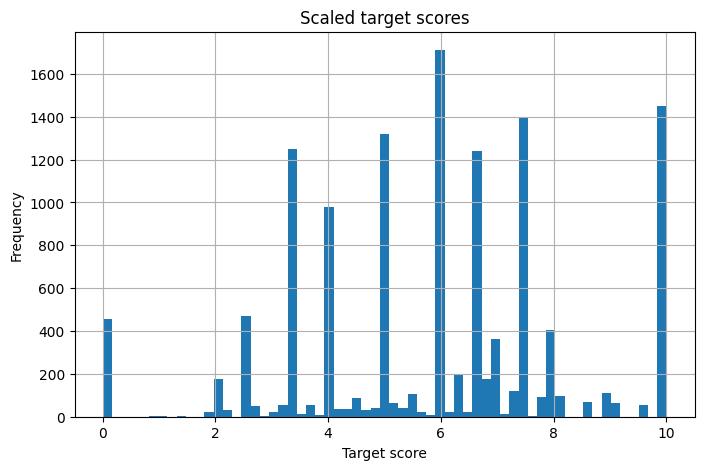

In [64]:
# Plotting Score histogram
y.hist(bins=61)
plt.title('Scaled target scores')
plt.xlabel('Target score')
plt.ylabel('Frequency')
plt.show()

In [81]:
from sklearn.model_selection import train_test_split

# Data to be split
X_train, X_test, y_train, y_test, scores_train, scores_test = \
        train_test_split(
                X,
                y,
                scores,
                test_size=0.2,
                random_state=26
                )

# Expanding dimensions of training data
print('X_train size: {}'.format(X_train.shape))
print('X_test size: {}'.format(X_test.shape))
#X_train = np.expand_dims(X_train, axis=2)
#X_test = np.expand_dims(X_test, axis=2)
#print('X_train size: {}'.format(X_train.shape))
#print('X_test size: {}'.format(X_test.shape))
print('y_train size: {}'.format(y_train.shape))
print('y_test size: {}'.format(y_test.shape))
print('scores_train size: {}'.format(scores_train.shape))
print('scores_test size: {}'.format(scores_test.shape))

output_dimension = y.shape[1]
input_dimension = X.shape[1]
dropout = 0.2


# Model Architechture Using LSTM
model = Sequential()
inputs = Input(shape=(input_dimension,1))
x = Bidirectional(LSTM(64, return_sequences=True),
                          merge_mode='concat')(inputs)
x = Dropout(dropout)(x)
x = Flatten()(x)
outputs = Dense(output_dimension)(x) #, activation='softmax'

model = Model(inputs=inputs, outputs=outputs, name='LSTM')

model.summary()

X_train size: (10379, 431)
X_test size: (2595, 431)
y_train size: (10379, 1)
y_test size: (2595, 1)
scores_train size: (10379, 4)
scores_test size: (2595, 4)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Model: "LSTM"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_15 (InputLayer)          │ (None, 431, 1)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ bidirectional_4 (Bidirectional)      │ (None, 431, 128)            │          33,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_15 (Dropout)                 │ (None, 431, 128)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_4 (Flatten)                  │ (None, 55168)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_26 (Dense)                     │ (None, 1)                   │          55,169 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 88,961 (347.50 KB)

 Trainable params: 88,961 (347.50 KB)

 Non-trainable params: 0 (0.00 B)

In [82]:
# Compile the model with Adam optimizer
from tensorflow.keras.callbacks import EarlyStopping
adam = Adam(learning_rate=0.0001, beta_1=0.9, beta_2=0.999, epsilon=1e-5)
model.compile(optimizer=adam, loss='mean_squared_error', metrics=['mse','mae'])
early_stopping = EarlyStopping(monitor='val_loss', patience=5)

epochs = 10
estimator = model.fit(X_train, y_train, epochs=epochs, batch_size=16)
model.save('LSTM_model.h5')

Epoch 1/10


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


649/649 ━━━━━━━━━━━━━━━━━━━━ 172s 260ms/step - loss: 12.8448 - mae: 2.7711 - mse: 12.8448
Epoch 2/10
649/649 ━━━━━━━━━━━━━━━━━━━━ 206s 267ms/step - loss: 3.4163 - mae: 1.4360 - mse: 3.4163
Epoch 3/10
649/649 ━━━━━━━━━━━━━━━━━━━━ 195s 257ms/step - loss: 3.1184 - mae: 1.3727 - mse: 3.1184
Epoch 4/10
649/649 ━━━━━━━━━━━━━━━━━━━━ 202s 258ms/step - loss: 2.8853 - mae: 1.3247 - mse: 2.8853
Epoch 5/10
649/649 ━━━━━━━━━━━━━━━━━━━━ 208s 268ms/step - loss: 2.7771 - mae: 1.2977 - mse: 2.7771
Epoch 6/10
649/649 ━━━━━━━━━━━━━━━━━━━━ 202s 268ms/step - loss: 2.7165 - mae: 1.2773 - mse: 2.7165
Epoch 7/10
649/649 ━━━━━━━━━━━━━━━━━━━━ 202s 269ms/step - loss: 2.6242 - mae: 1.2610 - mse: 2.6242
Epoch 8/10
649/649 ━━━━━━━━━━━━━━━━━━━━ 202s 269ms/step - loss: 2.5885 - mae: 1.2562 - mse: 2.5885
Epoch 9/10
649/649 ━━━━━━━━━━━━━━━━━━━━ 203s 271ms/step - loss: 2.5262 - mae: 1.2415 - mse: 2.5262
Epoch 10/10
649/649 ━━━━━━━━━━━━━━━━━━━━ 200s 267ms/step - loss: 2.4927 - mae: 1.2368 - mse: 2.4927


#### Results

In [83]:
print('X_test size: {}'.format(X_test.shape))
print(model.predict(X_test))
y_pred = pd.DataFrame(model.predict(X_test).reshape(-1))
print(y_pred)
# Merge results
results = scores_test.reset_index(drop=True)\
                    .join(y_pred)\
                    .rename(columns={0:'y_pred'})\
                    .sort_values(by='topic')\
                    .reset_index(drop=True)
results.head()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


X_test size: (2595, 431)
82/82 ━━━━━━━━━━━━━━━━━━━━ 10s 113ms/step
[[8.017062 ]
 [5.8503   ]
 [6.202329 ]
 ...
 [5.1883273]
 [6.7658453]
 [7.477284 ]]
82/82 ━━━━━━━━━━━━━━━━━━━━ 9s 107ms/step
             0
0     8.017062
1     5.850300
2     6.202329
3     4.218484
4     6.568424
...        ...
2590  6.188037
2591  6.249716
2592  5.188327
2593  6.765845
2594  7.477284

[2595 rows x 1 columns]


,index,topic,target_score,scaled,y_pred
0,3250,censorship,3,4.0,5.116545
1,2799,censorship,4,6.0,5.164461
2,2439,censorship,3,4.0,3.958499
3,2308,censorship,3,4.0,3.941695
4,1987,censorship,2,2.0,4.055764


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


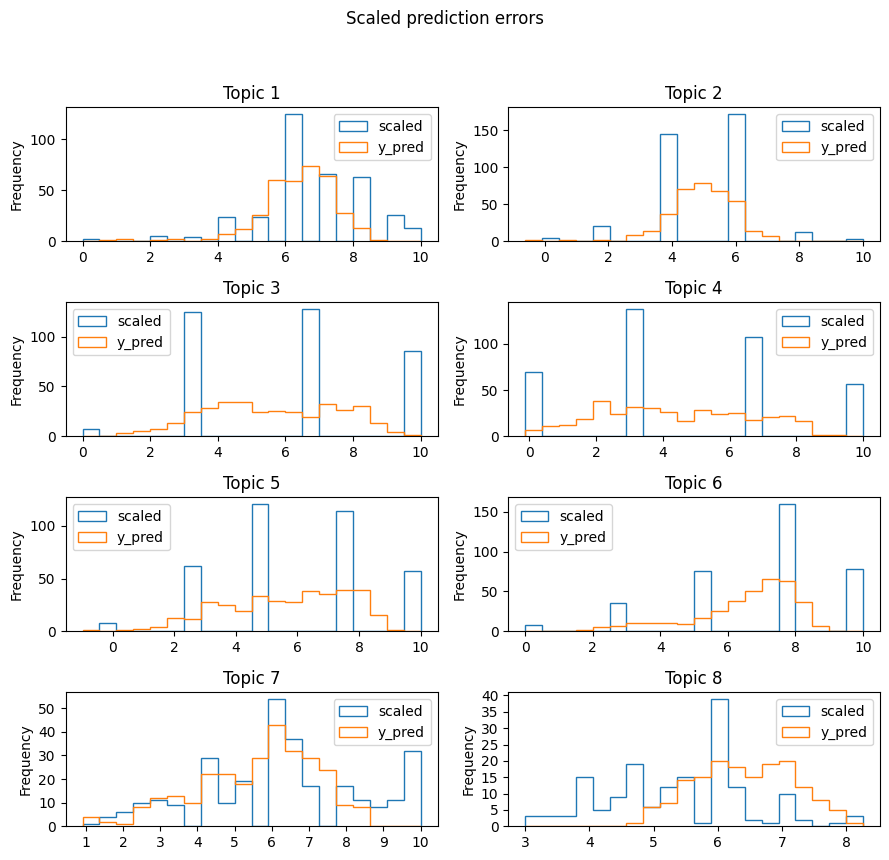

In [86]:
## Histogram of Scaled Prediction Errors for Each Topic
topic_names = ['computer', 'censorship', 'cyclist', 'hibiscus', 'mood', 'dirigibles', 'patience', 'laughter']
topic_number = 0
fig, ax = plt.subplots(4,2, figsize=(9,9), sharey=False)
for i in range(4):
    for j in range(2):
        results[results['topic'] == topic_names[topic_number]][['scaled', 'y_pred']].plot.hist(histtype='step', bins=20, ax=ax[i, j], rot=0)
        topic_number += 1
        ax[i,j].set_title('Topic %i' % topic_number)
ax[3,0].locator_params(nbins=10)
ax[3,1].locator_params(nbins=10)
plt.suptitle('Scaled prediction errors')
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


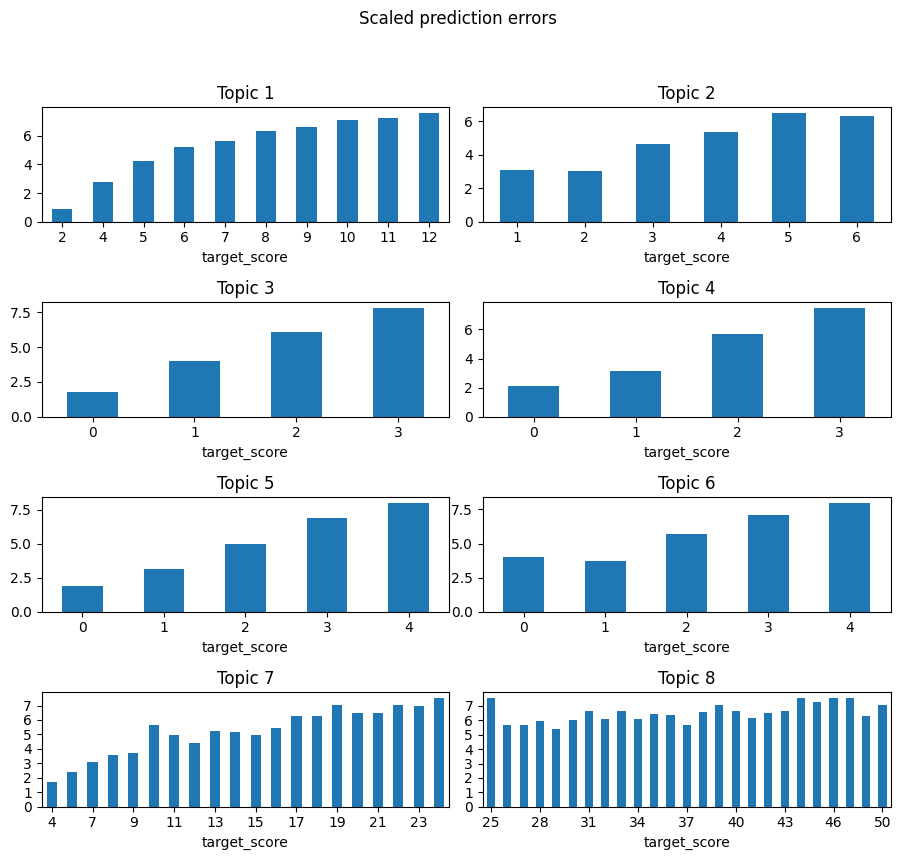

In [89]:
## Median Difference in Scaled Prediction Errors for Each Topic and Target Score

topic_number = 0
fig, ax = plt.subplots(4,2, figsize=(9,9), sharey=False)
for i in range(4):
    for j in range(2):
        results[results['topic'] == topic_names[topic_number]].groupby('target_score')['y_pred'].median().plot.bar(ax=ax[i, j], rot=0)
        topic_number += 1
        ax[i,j].set_title('Topic %i' % topic_number)
ax[3,0].locator_params(nbins=10)
ax[3,1].locator_params(nbins=10)
plt.suptitle('Scaled prediction errors')
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

In [93]:
## Transform Scaled Prediction and True Values Back to Original Range by Topic Number

score_df = results.groupby('topic')['target_score'].agg(['min', 'max'])
score_ranges = list(zip(score_df['min'], score_df['max']))

y_p_df = pd.Series() # y_predicted dataframe
y_t_df = pd.Series() #y_true dataframe

for topic in range(0,8):
    scaler = MinMaxScaler(score_ranges[topic])
    scaled_pred = results[results.topic == topic_names[topic]]['y_pred'].to_frame()
    y_pred_shrunk = scaler.fit_transform(scaled_pred).round(0).astype('int')
    scaled_true = results[results.topic == topic_names[topic]]['scaled'].to_frame()
    y_true_shrunk = scaler.fit_transform(scaled_true).round(0).astype('int')
    #y_p_df = y_p_df.append(pd.Series(np.squeeze(np.asarray(y_pred_shrunk))), ignore_index=True)
    #y_t_df = y_t_df.append(pd.Series(np.squeeze(np.asarray(y_true_shrunk))), ignore_index=True)
    y_p_df = pd.concat([y_p_df, pd.Series(np.squeeze(np.asarray(y_pred_shrunk)))], ignore_index=True)
    y_t_df = pd.concat([y_t_df, pd.Series(np.squeeze(np.asarray(y_true_shrunk)))], ignore_index=True)



# Append to results df
results['pred'] = y_p_df
results['y_true'] = y_t_df
results.head()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,index,topic,target_score,scaled,y_pred,pred,y_true
0,3250,censorship,3,4.0,5.116545,4,4
1,2799,censorship,4,6.0,5.164461,5,6
2,2439,censorship,3,4.0,3.958499,5,4
3,2308,censorship,3,4.0,3.941695,4,5
4,1987,censorship,2,2.0,4.055764,3,3


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


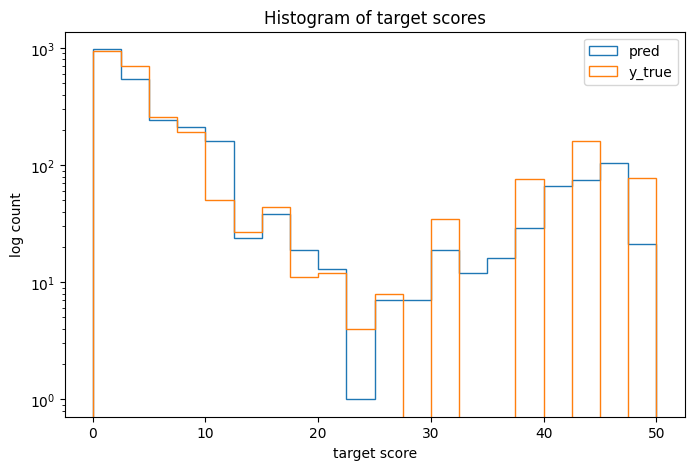

In [94]:
# histogram on Scores

results[['pred', 'y_true']].plot.hist(histtype='step', bins=20, logy=True)
plt.title('Histogram of target scores')
plt.xlabel('target score')
plt.ylabel('log count')
plt.savefig('image8.png', dpi=300)
plt.show()

#### kappa Scores

In [95]:
k = kappa(results.pred, results.target_score, weights='quadratic')
print('Combined essay kappa score: {:.4f}'.format(k))

Combined essay kappa score: 0.4725


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [97]:
## Calculate Weighted Quadratic Kappa Score by Topic

qwk = []
# weights = []
for topic in range(0,8):
    qwk.append(
            kappa(results[results.topic == topic_names[topic]]['target_score'],
                  results[results.topic == topic_names[topic]]['pred'],
                    weights='quadratic'))
#     weights.append(len(results[results.topic==topic])/X_test.shape[0])
mqwk = mean_quadratic_weighted_kappa(qwk, weights=1)
print('Weighted by topic Kappa score: {:.2f}%'.format(mqwk * 100))
qwk

Weighted by topic Kappa score: 5.64%


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


[-0.022391718877690092,
 -0.03873907644729768,
 0.6146600990237632,
 -0.122287764872139,
 0.0004232260737736526,
 0.026032089417703186,
 -0.03545047341391072,
 -0.07189603921590293]

In [99]:
# kappa scores for two expert raters
qwk = []
# weights = []
for topic in range(0,8):
    qwk.append(
            kappa(training_data[training_data.topic == topic_names[topic]]['rater1_domain1'],
                  training_data[training_data.topic == topic_names[topic]]['rater2_domain1'],
                    weights='quadratic'))

mqwk = mean_quadratic_weighted_kappa(qwk, weights=1)
print('Weighted by topic Kappa score: {:.4f}'.format(mqwk))

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Weighted by topic Kappa score: 0.7613


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


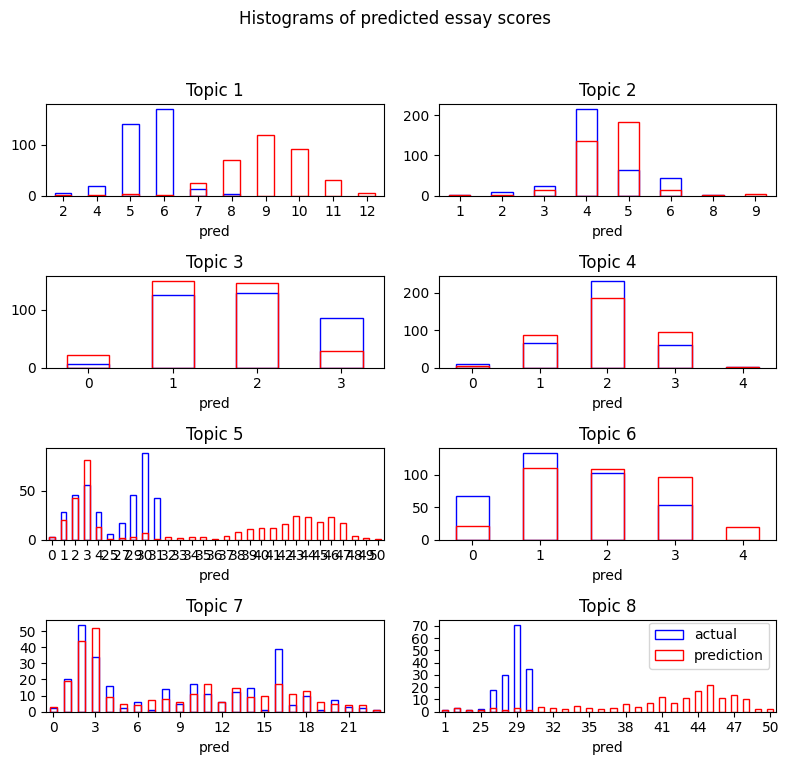

In [100]:
## Histograms of Predicted Essay Scores for Each Topic
topic_number = 0
fig, ax = plt.subplots(4,2, figsize=(8,8), sharey=False)
for i in range(4):
    for j in range(2):
        results[results['topic'] == topic_names[topic_number]]\
            .groupby('y_true')['y_true']\
            .agg('count')\
            .plot.bar(ax=ax[i, j], rot=0, fill=False, ec='b', label='actual')
        results[results['topic'] == topic_names[topic_number]]\
            .groupby('pred')['pred']\
            .agg('count')\
            .plot.bar(ax=ax[i, j], rot=0, fill=False, ec='r', label='prediction')
        topic_number += 1
        ax[i,j].set_title('Topic %i' % topic_number)
ax[3,0].locator_params(nbins=10)
ax[3,1].locator_params(nbins=10)
plt.suptitle('Histograms of predicted essay scores')
plt.legend(bbox_to_anchor=(1.0, 1.05))
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

In [104]:
print(estimator.history.keys())

dict_keys(['loss', 'mae', 'mse'])


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


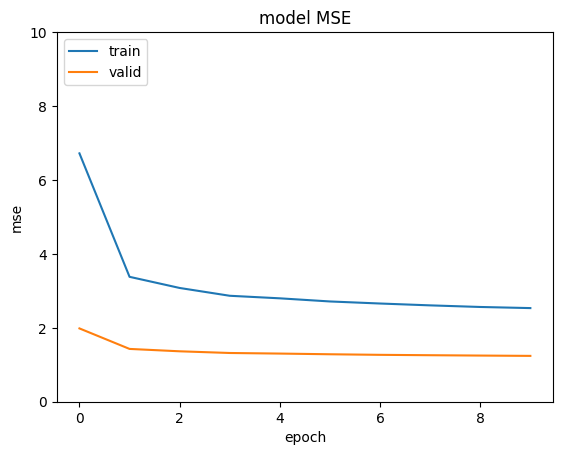

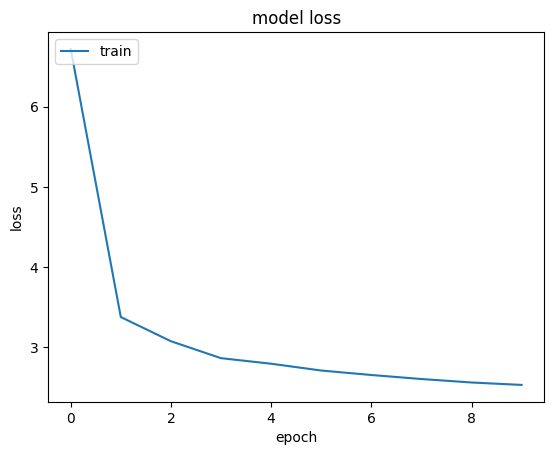

In [106]:
# Plot model mse over epochs
sns.reset_orig()   # Reset seaborn settings to get rid of black background
plt.plot(estimator.history['mse'])
plt.plot(estimator.history['mae'])
plt.title('model MSE')
plt.ylabel('mse')
plt.xlabel('epoch')
plt.legend(['train', 'valid'], loc='upper left')
plt.ylim(0,10)
plt.show()

# Plot model loss over epochs
plt.plot(estimator.history['loss'])
#plt.plot(estimator.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'valid'], loc='upper left')
plt.show()

In [107]:
# Calculate the number of scaling errors
errors_df = results.query('y_true != target_score')[['topic', 'target_score', 'y_true']]
error_percentage = len(errors_df) / results.shape[0] * 100

print('{:.1f}% of target scores did not revert back to their original value.'.format(error_percentage))


70.5% of target scores did not revert back to their original value.


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
